In [19]:
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob
from scipy.optimize import curve_fit

In [2]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\'
files = glob.glob(dataDir + 'ringdown_sweepPowers_flux=80uA*.h5')

In [3]:
files

['G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\ringdown_sweepPowers_flux=80uA_fflFreq=4.07GHz_DA=18dB_fDA=25dB_rrLen=1000clks_navg=50000_1.h5',
 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\ringdown_sweepPowers_flux=80uA_fflFreq=4.27GHz_DA=18dB_fDA=25dB_rrLen=1000clks_navg=50000_1.h5',
 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\ringdown_sweepPowers_flux=80uA_fflFreq=4.22GHz_DA=18dB_fDA=25dB_rrLen=1000clks_navg=50000_1.h5',
 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\ringdown_sweepPowers_flux=80uA_fflFreq=4.17GHz_DA=18dB_fDA=25dB_rrLen=1000clks_navg=50000_1.h5',
 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\20230414\\ringdown_sweepPowers_flux=80uA_fflFreq=4.12GHz_DA=18dB_fDA=25dB_rrLen=1000clks_navg=50000_1.h5']

In [6]:
fflFreq_list = []
amp_list = []
data = np.zeros((len(files), 11))
f =  h5py.File(files[0], 'r') 
print(f.keys())
key = list(f.keys())[0]
print(key)
num_of_entries = len(f[key].keys())
print(f'number of entries={num_of_entries}')

<KeysViewHDF5 ['sweep_ffl_amp_10:36:06']>
sweep_ffl_amp_10:36:06
number of entries=11


In [11]:
def decay(x,amp,tau,offset):
    return amp*np.exp(-x/tau)+offset

ffl_LO = 3672200000.0

# flux = 80 uA

<KeysViewHDF5 ['sweep_ffl_amp_10:36:06']>
<KeysViewHDF5 ['sweep_ffl_amp_11:52:34']>
<KeysViewHDF5 ['sweep_ffl_amp_11:33:22']>
<KeysViewHDF5 ['sweep_ffl_amp_11:14:17']>
<KeysViewHDF5 ['sweep_ffl_amp_10:55:12']>


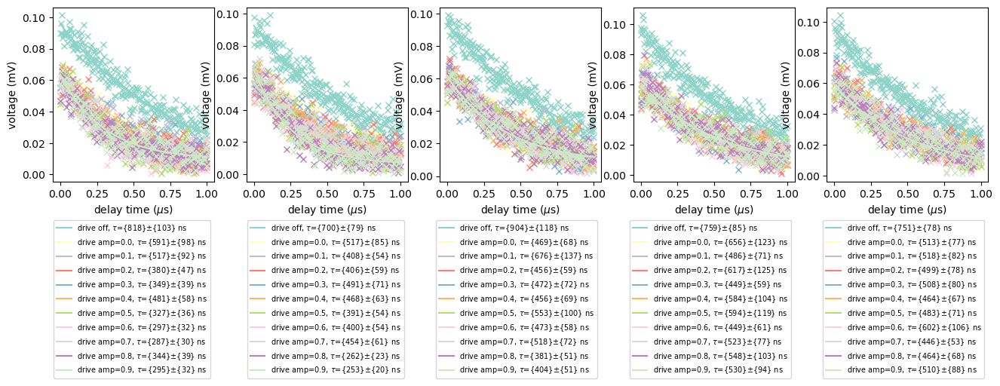

In [37]:
# initialize the plot
fig, axes = plt.subplots(1, len(files), figsize=(16,3))

t1 = np.zeros((len(files), num_of_entries))
t1_err = np.zeros((len(files),num_of_entries))
cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)
for n, file in enumerate(files):
    f =  h5py.File(file, 'r') 
    print(f.keys())
    key = list(f.keys())[0]
    for i in range(num_of_entries):
        entry0 = list(f[key].keys())[i]
        time = np.array(f[key][entry0]['t'])
        data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
        mag = abs(data) * 1e3
        tau = 0.2
        amp = abs(mag[0] - mag[-1])
        offset = 0

        p0 = [amp,tau,offset]
        fitFunction = decay
        fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
        error = np.sqrt(abs(np.diag(covar)))
        t1[n,i] = fitted_pars[1]
        t1_err[n,i] = error[1]
   
    
        axes[n].plot(time, mag ,'x',color = colors[i])
        if i != 0:
            label='drive amp='+entry0.split(' = ')[1] + ', '
        else:
            label = 'drive off, '

        axes[n].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[n,i]*1e3))
        axes[n].set_xlabel('delay time ('+r'$\mu$'+'s)')
        axes[n].set_ylabel('voltage (mV)')
        axes[n].legend(fontsize=7,bbox_to_anchor=(1, -0.2))
    f.close()
    


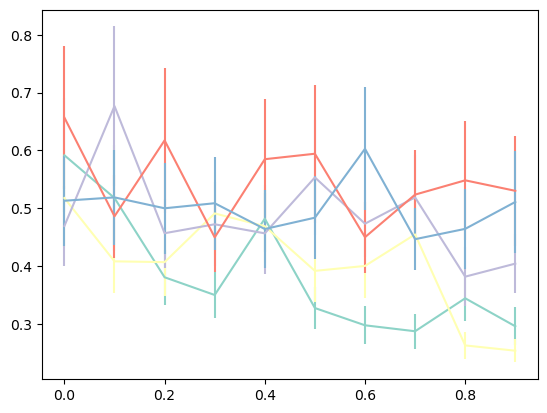

In [40]:
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(len(files)):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n])

# flux = 70 uA

In [41]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss08_09\\*\\'
files = glob.glob(dataDir + 'ringdown_sweepPowers_*DA=18dB_fDA=25dB*.h5')

In [42]:
len(files)

18

<KeysViewHDF5 ['sweep_ffl_amp_10:36:06']>
<KeysViewHDF5 ['sweep_ffl_amp_11:52:34']>
<KeysViewHDF5 ['sweep_ffl_amp_11:33:22']>
<KeysViewHDF5 ['sweep_ffl_amp_11:14:17']>
<KeysViewHDF5 ['sweep_ffl_amp_10:55:12']>
<KeysViewHDF5 ['sweep_ffl_amp_04:19:38']>
<KeysViewHDF5 ['sweep_ffl_amp_08:20:54']>
<KeysViewHDF5 ['sweep_ffl_amp_07:46:33']>
<KeysViewHDF5 ['sweep_ffl_amp_07:12:09']>
<KeysViewHDF5 ['sweep_ffl_amp_06:37:45']>
<KeysViewHDF5 ['sweep_ffl_amp_06:02:44']>
<KeysViewHDF5 ['sweep_ffl_amp_05:28:23']>
<KeysViewHDF5 ['sweep_ffl_amp_04:54:02']>
<KeysViewHDF5 ['sweep_ffl_amp_19:56:44']>
<KeysViewHDF5 ['sweep_ffl_amp_19:22:18']>
<KeysViewHDF5 ['sweep_ffl_amp_18:47:55']>
<KeysViewHDF5 ['sweep_ffl_amp_18:13:25']>
<KeysViewHDF5 ['sweep_ffl_amp_17:06:50']>


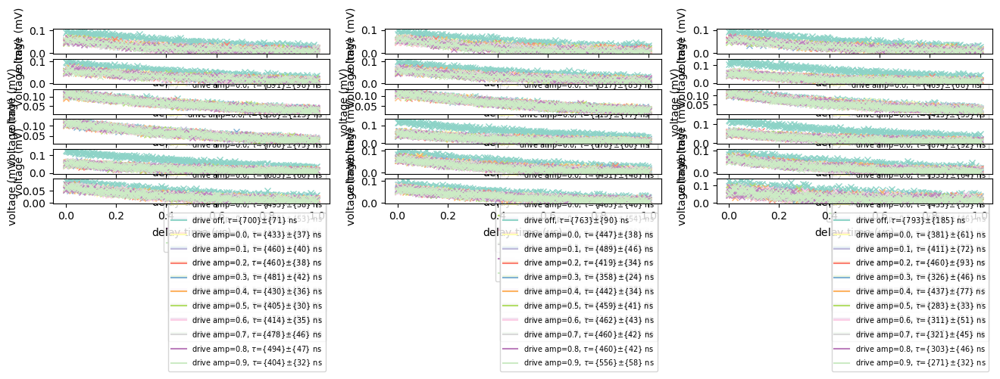

In [43]:
# initialize the plot
fig, axes = plt.subplots(6, 3, figsize=(16,3))
axes = axes.flatten()
t1 = np.zeros((len(files), num_of_entries))
t1_err = np.zeros((len(files),num_of_entries))
cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)
for n, file in enumerate(files):
    f =  h5py.File(file, 'r') 
    print(f.keys())
    key = list(f.keys())[0]
    for i in range(num_of_entries):
        entry0 = list(f[key].keys())[i]
        time = np.array(f[key][entry0]['t'])
        data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
        mag = abs(data) * 1e3
        tau = 0.2
        amp = abs(mag[0] - mag[-1])
        offset = 0

        p0 = [amp,tau,offset]
        fitFunction = decay
        fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
        error = np.sqrt(abs(np.diag(covar)))
        t1[n,i] = fitted_pars[1]
        t1_err[n,i] = error[1]
   
    
        axes[n].plot(time, mag ,'x',color = colors[i])
        if i != 0:
            label='drive amp='+entry0.split(' = ')[1] + ', '
        else:
            label = 'drive off, '

        axes[n].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[n,i]*1e3))
        axes[n].set_xlabel('delay time ('+r'$\mu$'+'s)')
        axes[n].set_ylabel('voltage (mV)')
        axes[n].legend(fontsize=7,bbox_to_anchor=(1, -0.2))
    f.close()
    


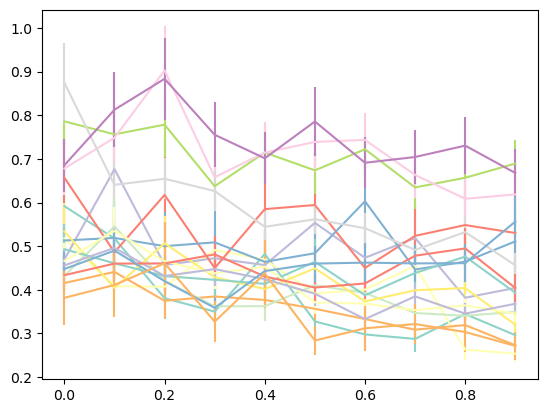

In [45]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(len(files)):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n])

# ffl_atten = 30 dB

In [47]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\*\\'
files = glob.glob(dataDir + 'ringdown_sweepPowers_*DA=18dB_fDA=30dB*_navg=100000*.h5')
len(files)

20

<KeysViewHDF5 ['sweep_ffl_amp_00:50:01']>
<KeysViewHDF5 ['sweep_ffl_amp_01:25:38']>
<KeysViewHDF5 ['sweep_ffl_amp_02:01:16']>
<KeysViewHDF5 ['sweep_ffl_amp_02:36:53']>
<KeysViewHDF5 ['sweep_ffl_amp_03:12:32']>
<KeysViewHDF5 ['sweep_ffl_amp_03:48:09']>
<KeysViewHDF5 ['sweep_ffl_amp_04:23:48']>
<KeysViewHDF5 ['sweep_ffl_amp_05:00:51']>
<KeysViewHDF5 ['sweep_ffl_amp_05:36:28']>
<KeysViewHDF5 ['sweep_ffl_amp_06:12:06']>
<KeysViewHDF5 ['sweep_ffl_amp_06:47:45']>
<KeysViewHDF5 ['sweep_ffl_amp_07:23:22']>
<KeysViewHDF5 ['sweep_ffl_amp_07:59:01']>
<KeysViewHDF5 ['sweep_ffl_amp_08:34:39']>
<KeysViewHDF5 ['sweep_ffl_amp_09:11:39']>
<KeysViewHDF5 ['sweep_ffl_amp_09:47:18']>
<KeysViewHDF5 ['sweep_ffl_amp_10:23:02']>
<KeysViewHDF5 ['sweep_ffl_amp_10:58:45']>
<KeysViewHDF5 ['sweep_ffl_amp_11:34:30']>
<KeysViewHDF5 ['sweep_ffl_amp_20:14:13']>


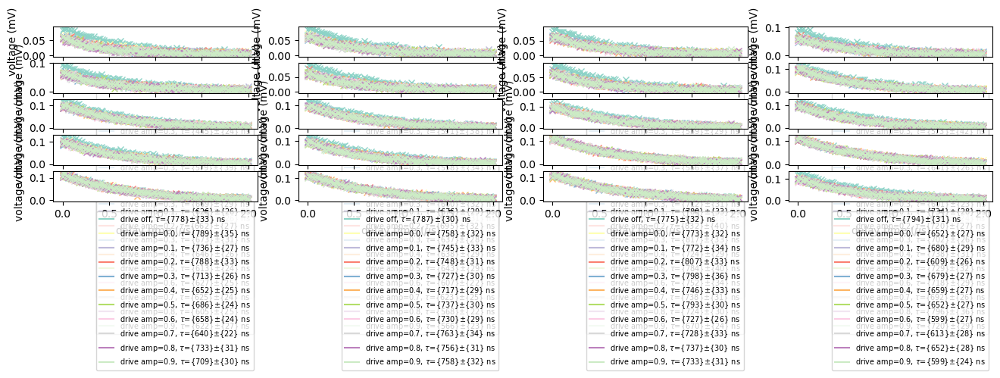

In [52]:
# initialize the plot
fig, axes = plt.subplots(5, 4, figsize=(16,3))
axes = axes.flatten()
t1 = np.zeros((len(files), num_of_entries))
t1_err = np.zeros((len(files),num_of_entries))
freqs = np.zeros((len(files,)))
cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)
for n, file in enumerate(files):
    f =  h5py.File(file, 'r') 
    freqs[n] = float(file.split('fflFreq=')[-1].split('GHz')[0])
    print(f.keys())
    key = list(f.keys())[0]
    for i in range(num_of_entries):
        entry0 = list(f[key].keys())[i]
        time = np.array(f[key][entry0]['t'])
        data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
        mag = abs(data) * 1e3
        tau = 0.2
        amp = abs(mag[0] - mag[-1])
        offset = 0

        p0 = [amp,tau,offset]
        fitFunction = decay
        fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
        error = np.sqrt(abs(np.diag(covar)))
        t1[n,i] = fitted_pars[1]
        t1_err[n,i] = error[1]
   
    
        axes[n].plot(time, mag ,'x',color = colors[i])
        if i != 0:
            label='drive amp='+entry0.split(' = ')[1] + ', '
        else:
            label = 'drive off, '

        axes[n].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[n,i]*1e3))
        axes[n].set_xlabel('delay time ('+r'$\mu$'+'s)')
        axes[n].set_ylabel('voltage (mV)')
        axes[n].legend(fontsize=7,bbox_to_anchor=(1, -0.2))
    f.close()
    


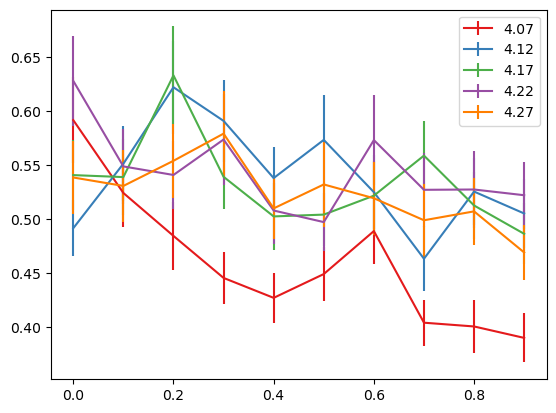

In [57]:
colors = sns.color_palette("Set1", 20)
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

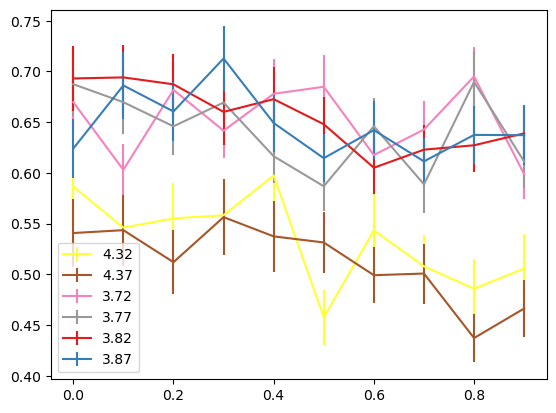

In [59]:
colors = sns.color_palette("Set1", 20)
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5,11):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

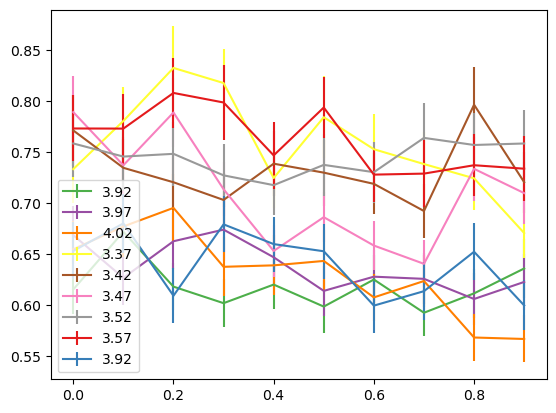

In [60]:
colors = sns.color_palette("Set1", 20)
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(11,20):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

In [61]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\*\\'
files = glob.glob(dataDir + 'ringdown_sweepPowers_*DA=18dB_fDA=30dB*_navg=50000*.h5')
len(files)

35

## wider freqs range

<KeysViewHDF5 ['sweep_ffl_amp_21:50:22']>
<KeysViewHDF5 ['sweep_ffl_amp_22:08:35']>
<KeysViewHDF5 ['sweep_ffl_amp_22:26:47']>
<KeysViewHDF5 ['sweep_ffl_amp_22:44:58']>
<KeysViewHDF5 ['sweep_ffl_amp_23:03:07']>
<KeysViewHDF5 ['sweep_ffl_amp_23:21:17']>
<KeysViewHDF5 ['sweep_ffl_amp_23:39:32']>
<KeysViewHDF5 ['sweep_ffl_amp_00:30:51']>
<KeysViewHDF5 ['sweep_ffl_amp_00:49:04']>
<KeysViewHDF5 ['sweep_ffl_amp_01:07:18']>
<KeysViewHDF5 ['sweep_ffl_amp_01:25:36']>
<KeysViewHDF5 ['sweep_ffl_amp_01:43:54']>
<KeysViewHDF5 ['sweep_ffl_amp_02:02:07']>
<KeysViewHDF5 ['sweep_ffl_amp_02:20:26']>
<KeysViewHDF5 ['sweep_ffl_amp_02:40:11']>
<KeysViewHDF5 ['sweep_ffl_amp_02:58:28']>
<KeysViewHDF5 ['sweep_ffl_amp_03:16:45']>
<KeysViewHDF5 ['sweep_ffl_amp_03:34:58']>
<KeysViewHDF5 ['sweep_ffl_amp_03:53:17']>
<KeysViewHDF5 ['sweep_ffl_amp_04:11:35']>
<KeysViewHDF5 ['sweep_ffl_amp_04:29:58']>
<KeysViewHDF5 ['sweep_ffl_amp_04:49:41']>
<KeysViewHDF5 ['sweep_ffl_amp_05:07:58']>
<KeysViewHDF5 ['sweep_ffl_amp_05:2

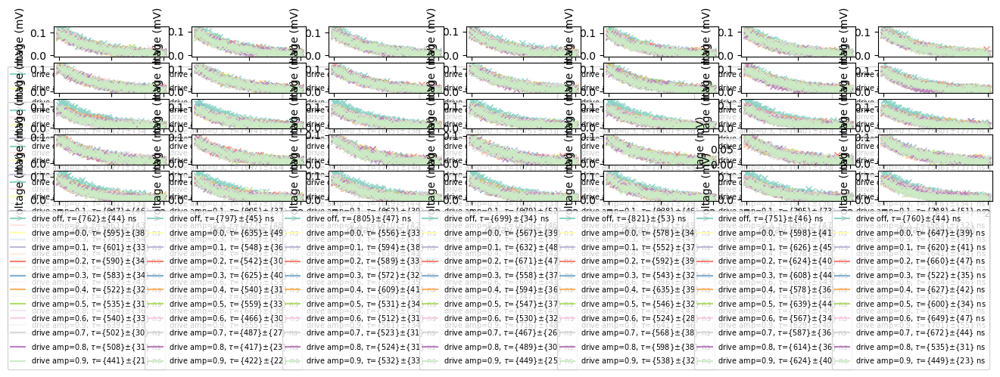

In [62]:
# initialize the plot
fig, axes = plt.subplots(5, 7, figsize=(16,3))
axes = axes.flatten()
t1 = np.zeros((len(files), num_of_entries))
t1_err = np.zeros((len(files),num_of_entries))
freqs = np.zeros((len(files,)))
cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)
for n, file in enumerate(files):
    f =  h5py.File(file, 'r') 
    freqs[n] = float(file.split('fflFreq=')[-1].split('GHz')[0])
    print(f.keys())
    key = list(f.keys())[0]
    for i in range(num_of_entries):
        entry0 = list(f[key].keys())[i]
        time = np.array(f[key][entry0]['t'])
        data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
        mag = abs(data) * 1e3
        tau = 0.2
        amp = abs(mag[0] - mag[-1])
        offset = 0

        p0 = [amp,tau,offset]
        fitFunction = decay
        fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
        error = np.sqrt(abs(np.diag(covar)))
        t1[n,i] = fitted_pars[1]
        t1_err[n,i] = error[1]
   
    
        axes[n].plot(time, mag ,'x',color = colors[i])
        if i != 0:
            label='drive amp='+entry0.split(' = ')[1] + ', '
        else:
            label = 'drive off, '

        axes[n].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[n,i]*1e3))
        axes[n].set_xlabel('delay time ('+r'$\mu$'+'s)')
        axes[n].set_ylabel('voltage (mV)')
        axes[n].legend(fontsize=7,bbox_to_anchor=(1, -0.2))
    f.close()
    


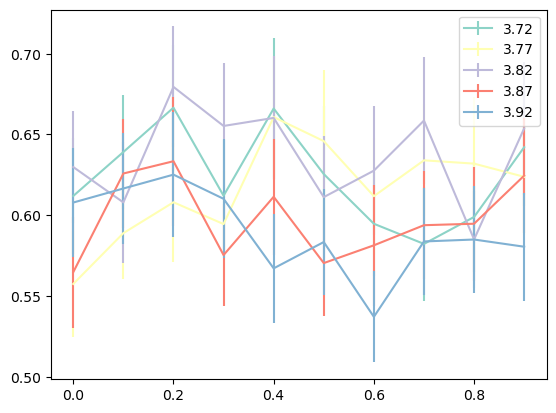

In [66]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

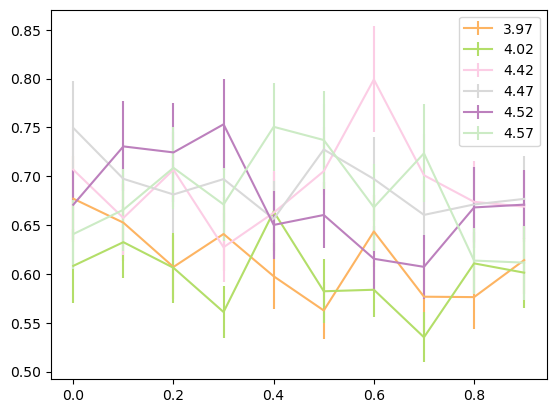

In [67]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5,11):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

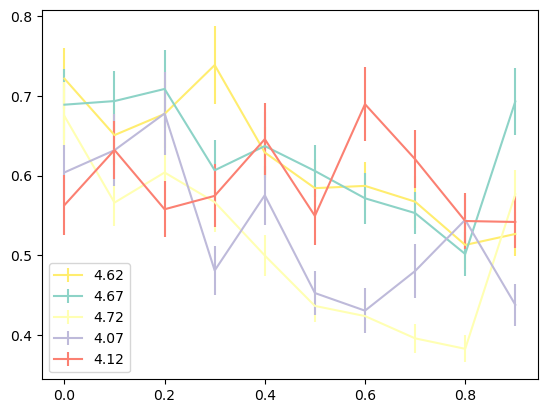

In [68]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(11,16):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

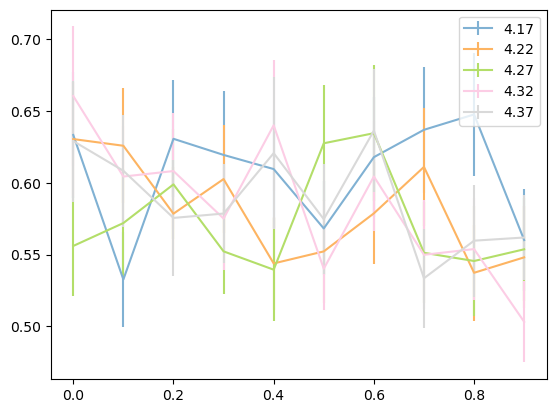

In [69]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(16,21):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

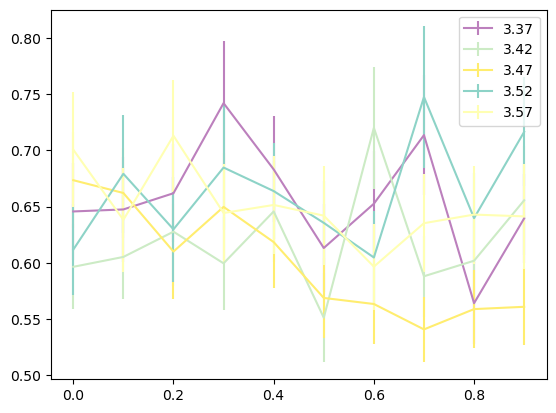

In [70]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(21,26):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

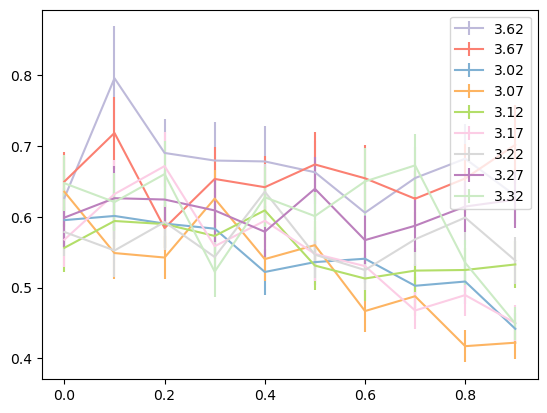

In [71]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(26,35):
    plt.errorbar(amp_list, t1[n,1:], yerr=t1_err[n,1:],color=colors[n],label=freqs[n])
plt.legend()

### repeat after mixer calibration

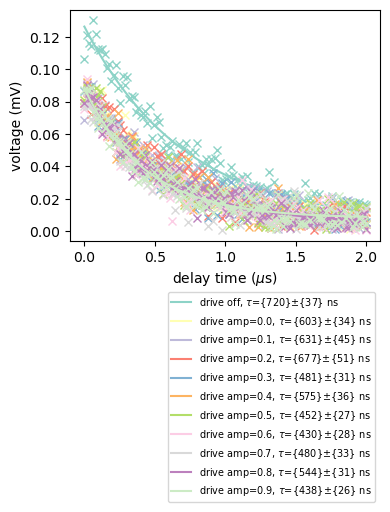

In [128]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=4.07GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_1.h5')


f =  h5py.File(file[0], 'r')

amp_keys = list(f['sweep_ffl_amp_02:40:11'].keys())


fig, axes = plt.subplots(1, 1, figsize=(4,3))

t1 = np.zeros((num_of_entries,))
t1_err = np.zeros((num_of_entries,))

cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)


key = 'sweep_ffl_amp_02:40:11'
for i in range(num_of_entries):
    entry0 = amp_keys[i]
    time = np.array(f[key][entry0]['t'])
    data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
    mag = abs(data) * 1e3
    tau = 0.2
    amp = abs(mag[0] - mag[-1])
    offset = 0

    p0 = [amp,tau,offset]
    fitFunction = decay
    fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
    error = np.sqrt(abs(np.diag(covar)))
    t1[i] = fitted_pars[1]
    t1_err[i] = error[1]


    axes.plot(time, mag ,'x',color = colors[i])
    if i != 0:
        label='drive amp='+entry0.split(' = ')[1] + ', '
    else:
        label = 'drive off, '

    axes.plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[i]*1e3))
    axes.set_xlabel('delay time ('+r'$\mu$'+'s)')
    axes.set_ylabel('voltage (mV)')
    axes.legend(fontsize=7,bbox_to_anchor=(1, -0.2))
 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


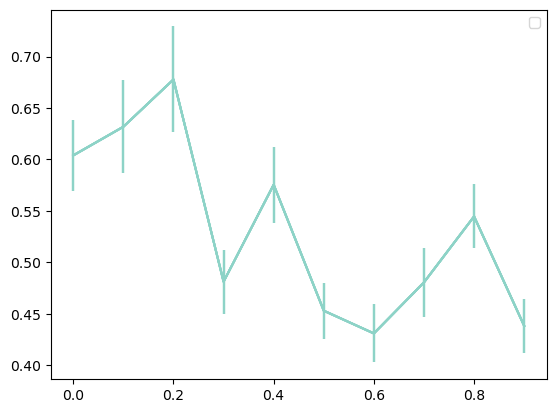

In [131]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5):
    plt.errorbar(amp_list, t1[1:], yerr=t1_err[1:],color=colors[0])
plt.legend()

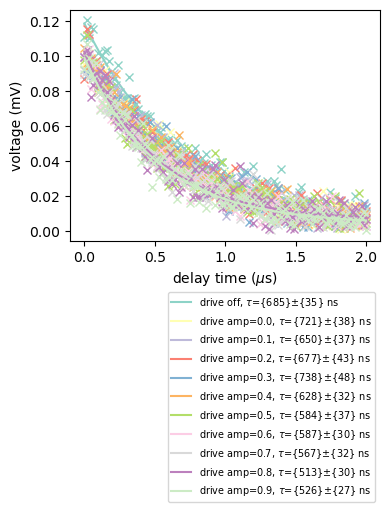

In [134]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=4.62GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_1.h5')

f =  h5py.File(file[0], 'r')
key = list(f.keys())[0]
amp_keys = list(f[key].keys())


fig, axes = plt.subplots(1, 1, figsize=(4,3))

t1 = np.zeros((num_of_entries,))
t1_err = np.zeros((num_of_entries,))

cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)

for i in range(num_of_entries):
    entry0 = amp_keys[i]
    time = np.array(f[key][entry0]['t'])
    data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
    mag = abs(data) * 1e3
    tau = 0.2
    amp = abs(mag[0] - mag[-1])
    offset = 0

    p0 = [amp,tau,offset]
    fitFunction = decay
    fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
    error = np.sqrt(abs(np.diag(covar)))
    t1[i] = fitted_pars[1]
    t1_err[i] = error[1]


    axes.plot(time, mag ,'x',color = colors[i])
    if i != 0:
        label='drive amp='+entry0.split(' = ')[1] + ', '
    else:
        label = 'drive off, '

    axes.plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[i]*1e3))
    axes.set_xlabel('delay time ('+r'$\mu$'+'s)')
    axes.set_ylabel('voltage (mV)')
    axes.legend(fontsize=7,bbox_to_anchor=(1, -0.2))

f.close()
 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


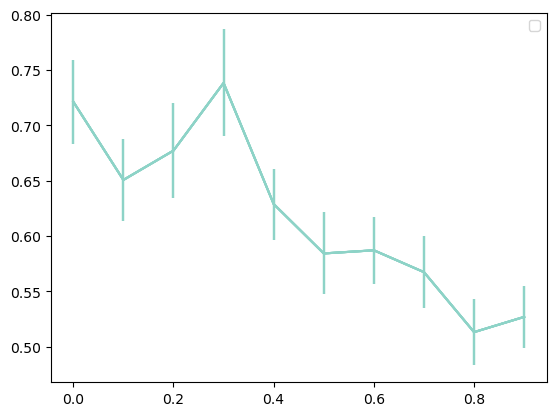

In [135]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5):
    plt.errorbar(amp_list, t1[1:], yerr=t1_err[1:],color=colors[0])
plt.legend()

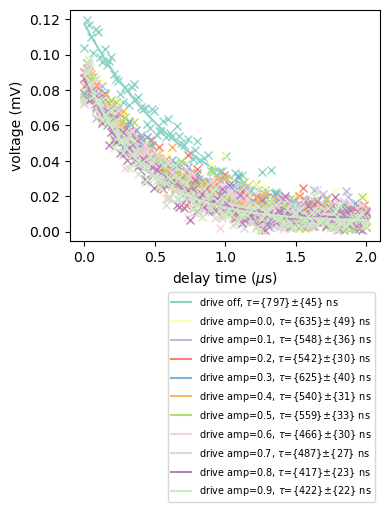

In [136]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=3.07GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_1.h5')

f =  h5py.File(file[0], 'r')
key = list(f.keys())[0]
amp_keys = list(f[key].keys())


fig, axes = plt.subplots(1, 1, figsize=(4,3))

t1 = np.zeros((num_of_entries,))
t1_err = np.zeros((num_of_entries,))

cmap =['#000000',
        '#e69f00',
        '#56b4e9',
        '#009e73',
        '#cc79a7',
        '#f0e442',
        '#0072b2',
        '#d55e00',
        ]
colors = sns.color_palette("Set3", 11)

for i in range(num_of_entries):
    entry0 = amp_keys[i]
    time = np.array(f[key][entry0]['t'])
    data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
    mag = abs(data) * 1e3
    tau = 0.2
    amp = abs(mag[0] - mag[-1])
    offset = 0

    p0 = [amp,tau,offset]
    fitFunction = decay
    fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
    error = np.sqrt(abs(np.diag(covar)))
    t1[i] = fitted_pars[1]
    t1_err[i] = error[1]


    axes.plot(time, mag ,'x',color = colors[i])
    if i != 0:
        label='drive amp='+entry0.split(' = ')[1] + ', '
    else:
        label = 'drive off, '

    axes.plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[i]*1e3))
    axes.set_xlabel('delay time ('+r'$\mu$'+'s)')
    axes.set_ylabel('voltage (mV)')
    axes.legend(fontsize=7,bbox_to_anchor=(1, -0.2))

f.close()
 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


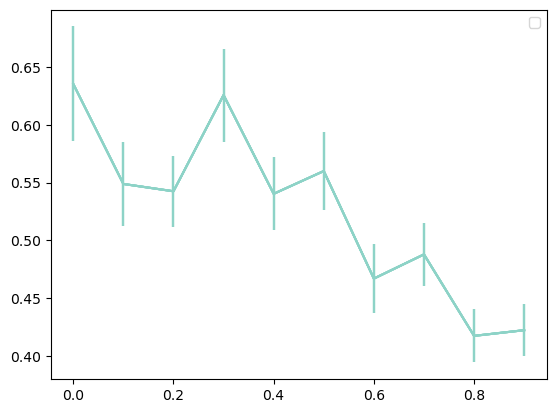

In [137]:
colors = sns.color_palette("Set3", len(files))
amp_list = [round(0.0 + 0.1* n,1) for n in range(10)]
for n in range(5):
    plt.errorbar(amp_list, t1[1:], yerr=t1_err[1:],color=colors[0])
plt.legend()

### repeat after change IF frequency from 50 MHz to 350 MHz

In [312]:
def plot_sweep_data(fname, plot=True):
    fflFreq = fname.split('fflFreq=')[1].split('GHz')[0]
    f =  h5py.File(fname, 'r')
    key = list(f.keys())[0]
    amp_keys = list(f[key].keys())
    num_of_entries = len(amp_keys)
    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(8,5))

    t1 = np.zeros((num_of_entries,))
    t1_err = np.zeros((num_of_entries,))

    cmap =['#000000',
            '#e69f00',
            '#56b4e9',
            '#009e73',
            '#cc79a7',
            '#f0e442',
            '#0072b2',
            '#d55e00',
            ]
    colors = sns.color_palette("Set3", 11)

    for i in range(num_of_entries):
        entry0 = amp_keys[i]
        time = np.array(f[key][entry0]['t'])
        data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
        mag = abs(data) * 1e3
        tau = 0.2
        amp = abs(mag[0] - mag[-1])
        offset = 0

        p0 = [amp,tau,offset]
        fitFunction = decay
        fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
        error = np.sqrt(abs(np.diag(covar)))
        t1[i] = fitted_pars[1]
        t1_err[i] = error[1]

        if plot:
            axes[0].plot(time, mag ,'x',color = colors[i])
            if i != 0:
                label='drive amp='+entry0.split(' = ')[1] + ', '
            else:
                label = 'drive off, '

            axes[0].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[i]*1e3))
            axes[0].set_xlabel('delay time ('+r'$\mu$'+'s)')
            axes[0].set_ylabel('voltage (mV)')
            axes[0].legend(fontsize=7,bbox_to_anchor=(1.3, -0.22),ncol=2)
            
            
    if plot:
        amp_list = [round(0.0 + 0.1* n,1) for n in range(len(amp_keys)-1)]
        print(t1.shape, t1_err.shape, num_of_entries)
        axes[-1].errorbar(amp_list, t1[1:], yerr=t1_err[1:],color=colors[0], label=f'{fflFreq}GHz')
        axes[-1].legend()
        fig.tight_layout()
        fig.show()
    
    return t1, t1_err

    

    

In [153]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\ringdown\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=3.07GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_2.h5')
plot_sweep_data(file[0])

['G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\ringdown\\ringdown_sweepPowers_flux=70uA_fflFreq=3.07GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_2.h5']

C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2518748882.py:58: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


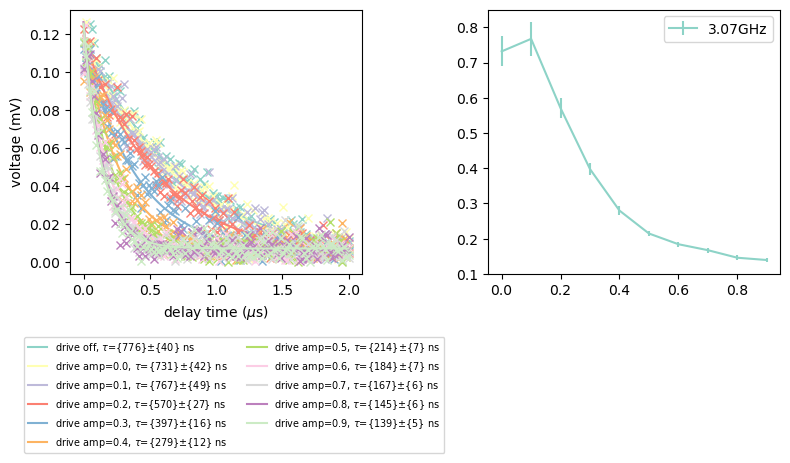

In [168]:
plot_sweep_data(file[0])

C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2518748882.py:58: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


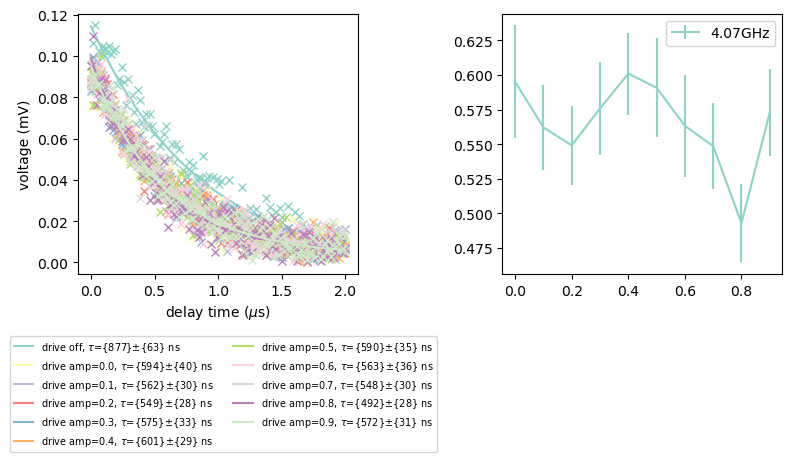

In [169]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\ringdown\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=4.07GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_2.h5')
plot_sweep_data(file[0])

C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2518748882.py:58: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


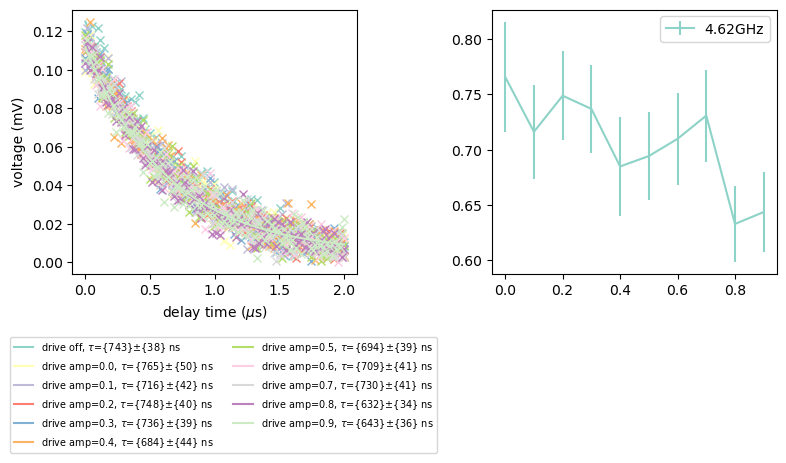

In [170]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230418\\ringdown\\'
file = glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=4.62GHz_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000_2.h5')
plot_sweep_data(file[0])

### long sweep around 3.07 GHz 

In [278]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230419\\ringdown\\'
files = list(glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=*_DA=18dB_fDA=30dB_rrLen=1000clks_navg=50000*.h5'))


In [279]:
files.sort(key=lambda f: float(f.split('fflFreq=')[1].split('GHz')[0]))

(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=(8,5))


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


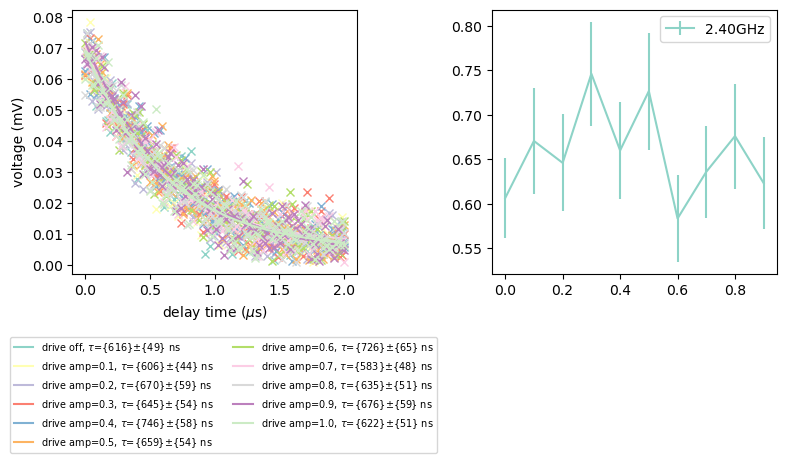

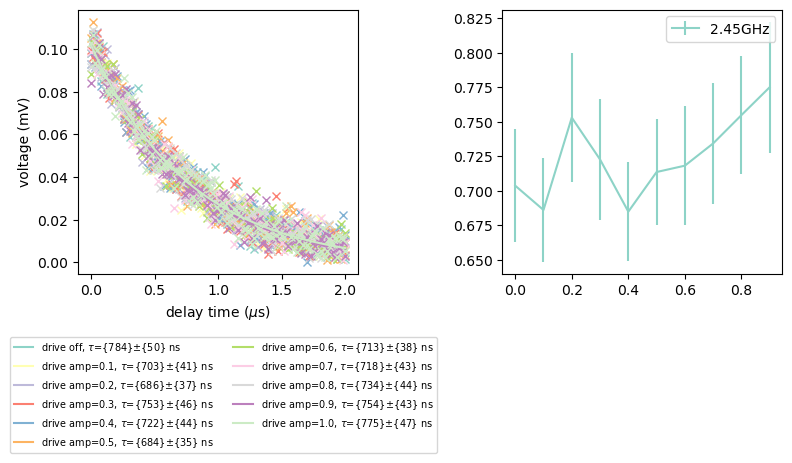

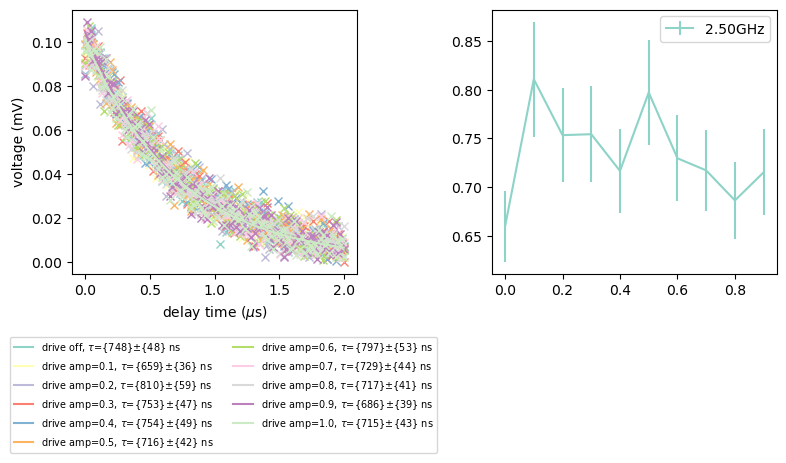

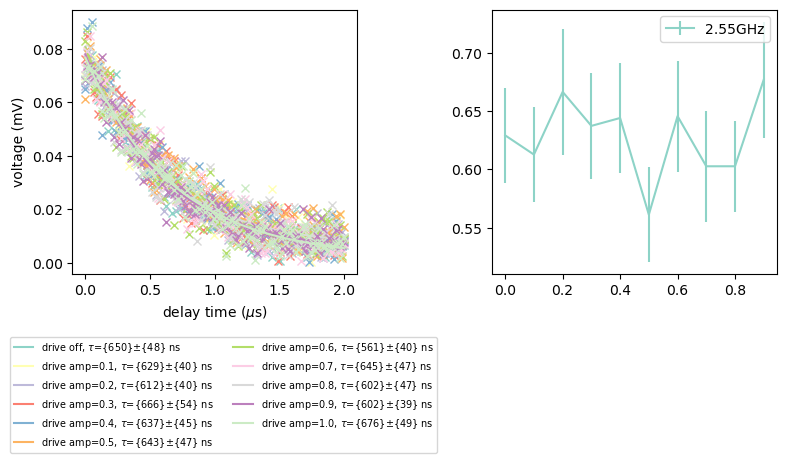

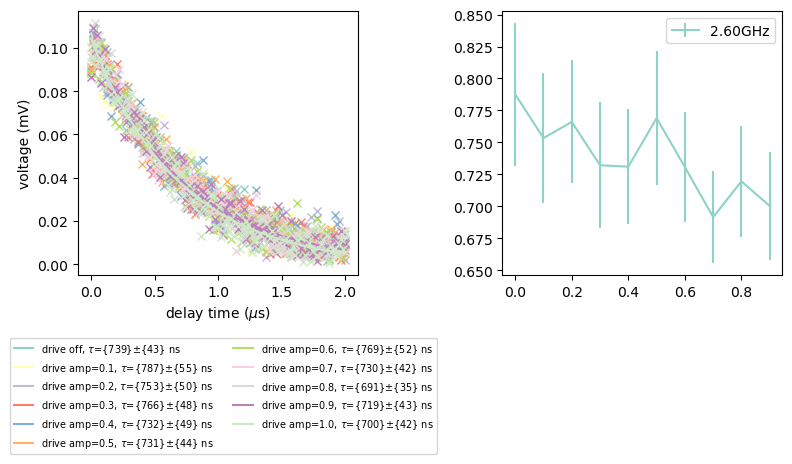

...

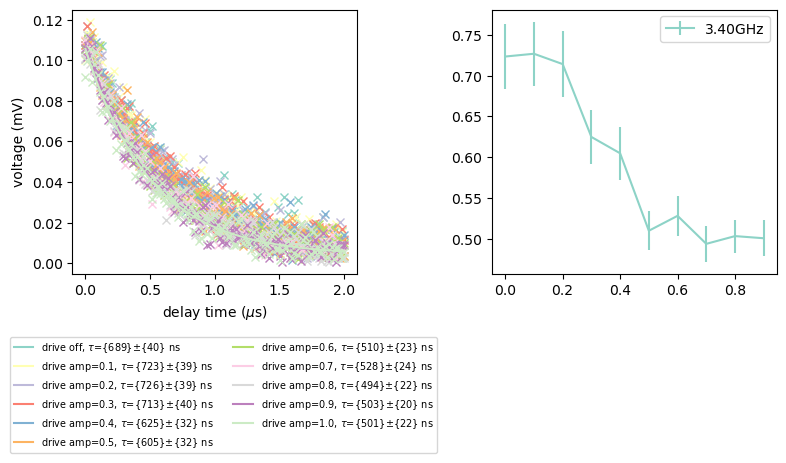

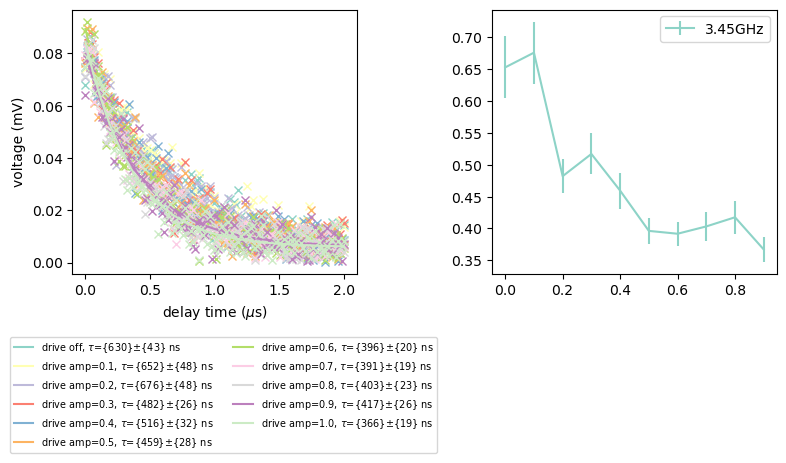

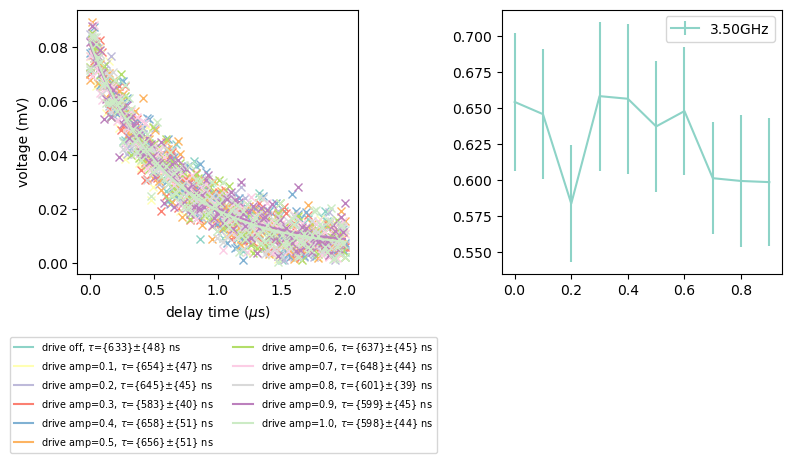

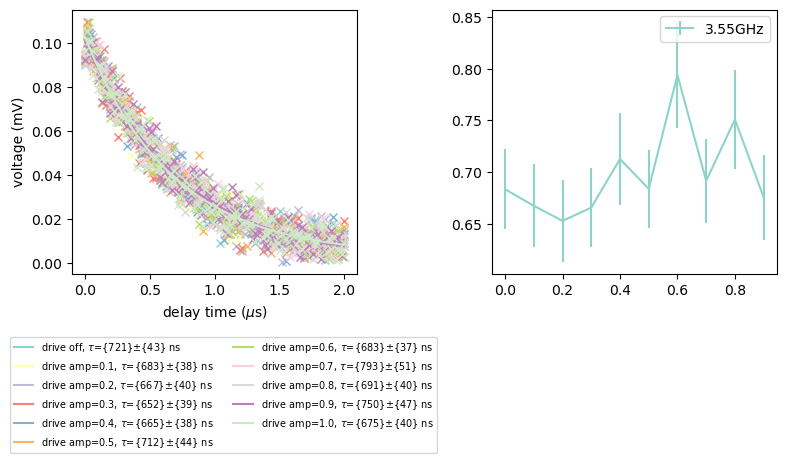

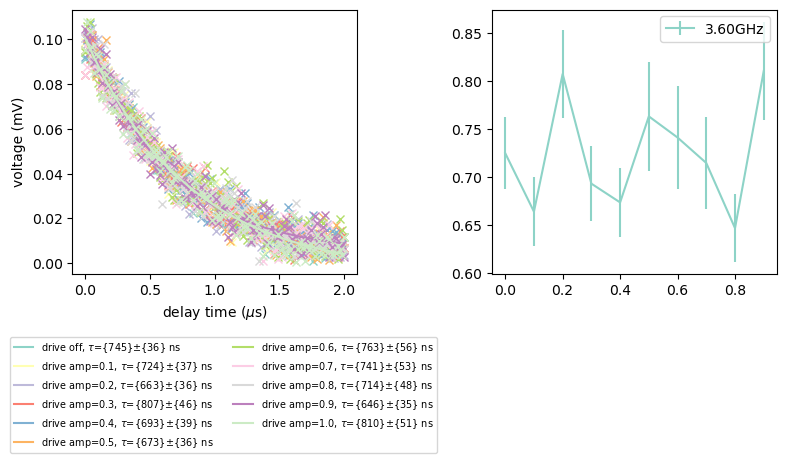

In [303]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


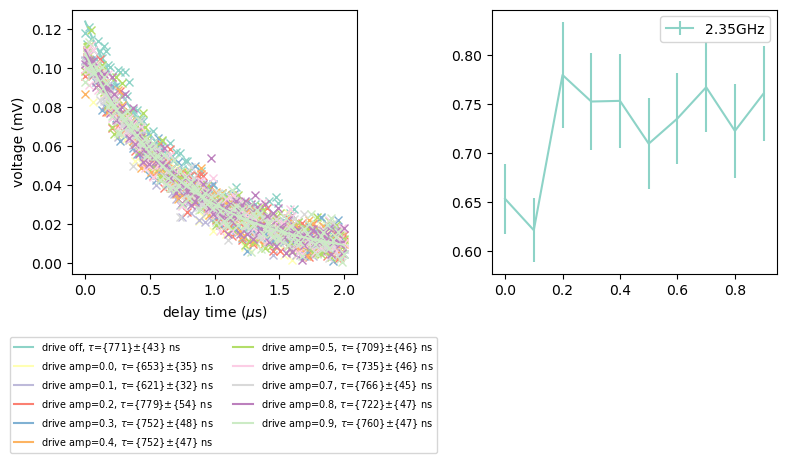

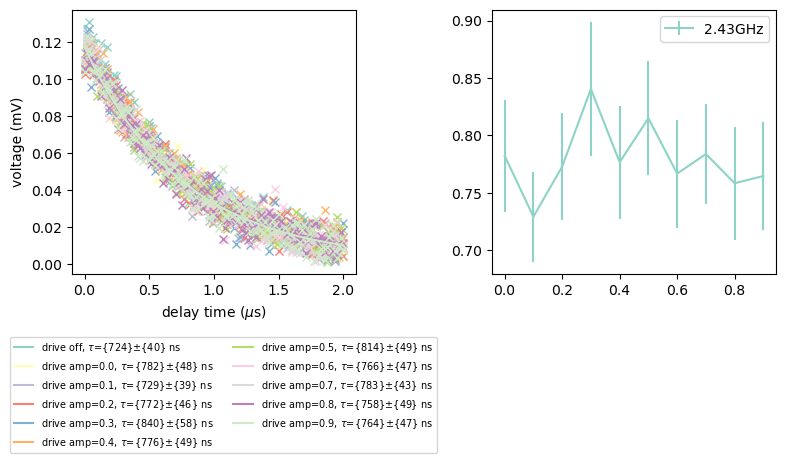

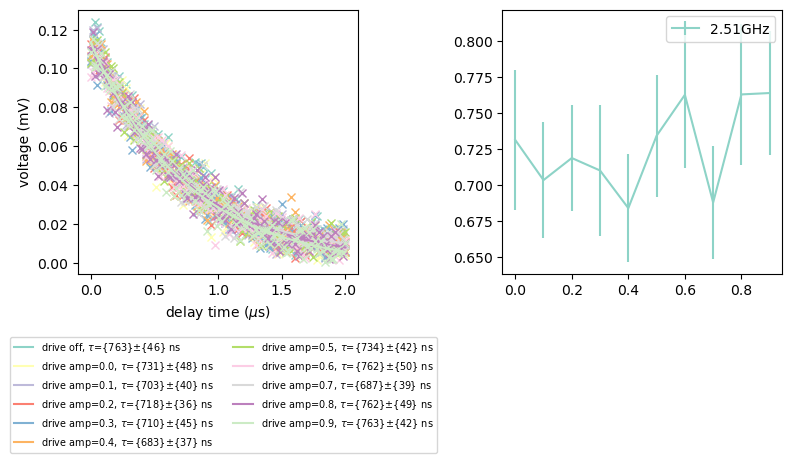

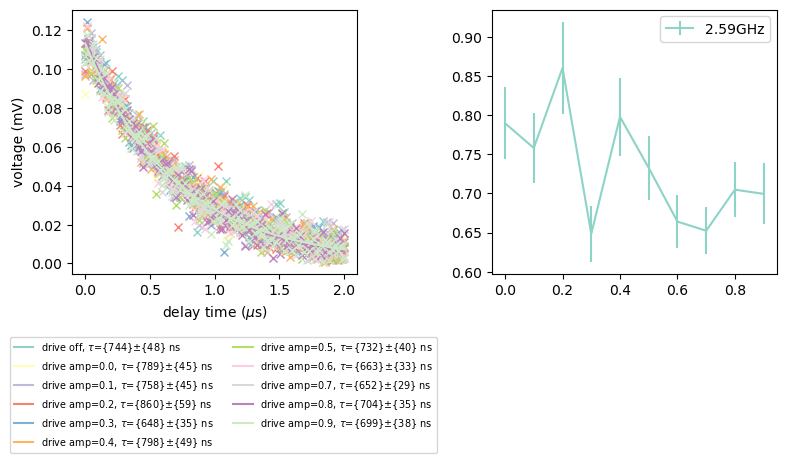

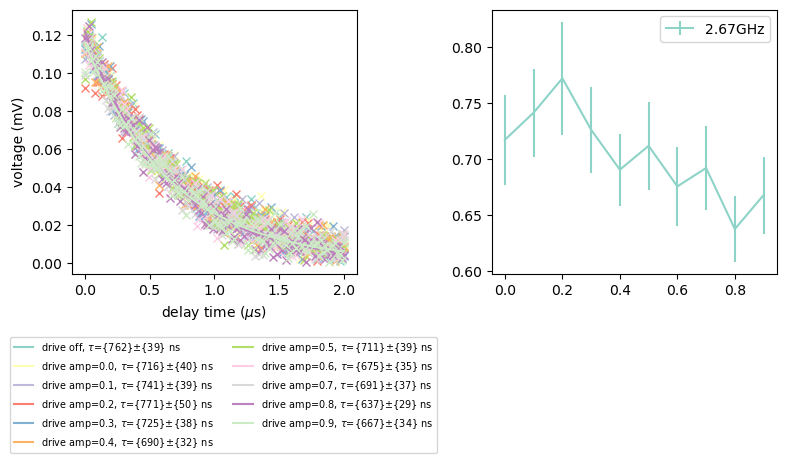

...

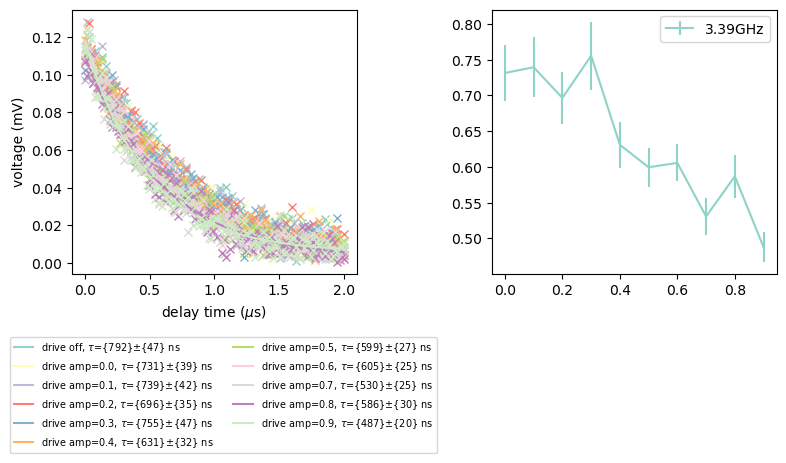

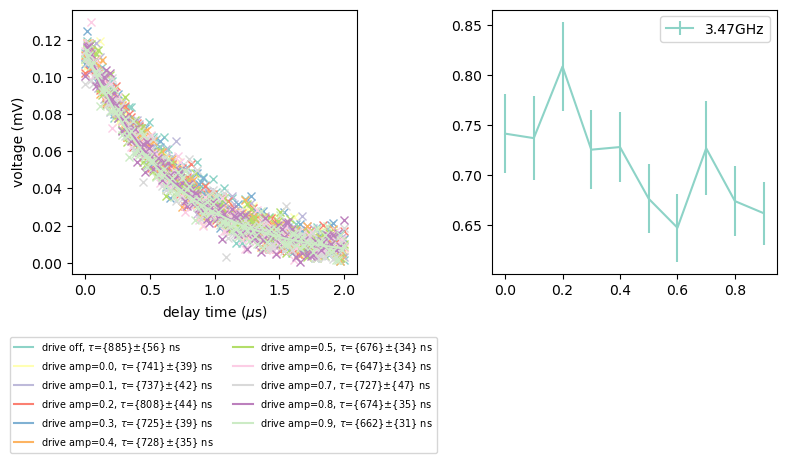

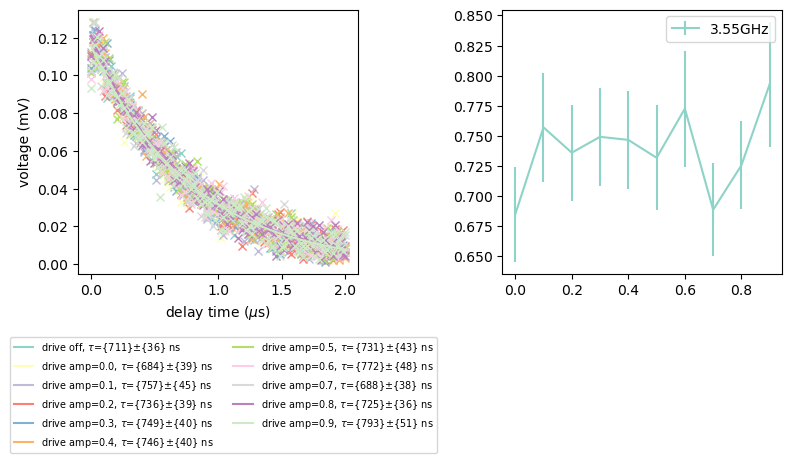

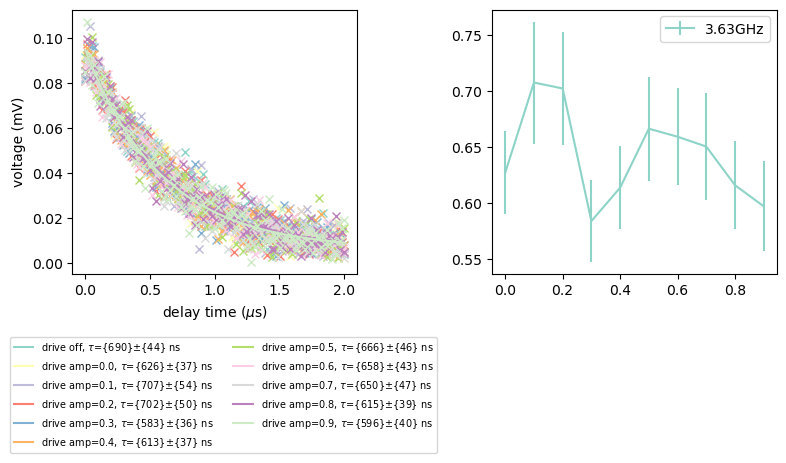

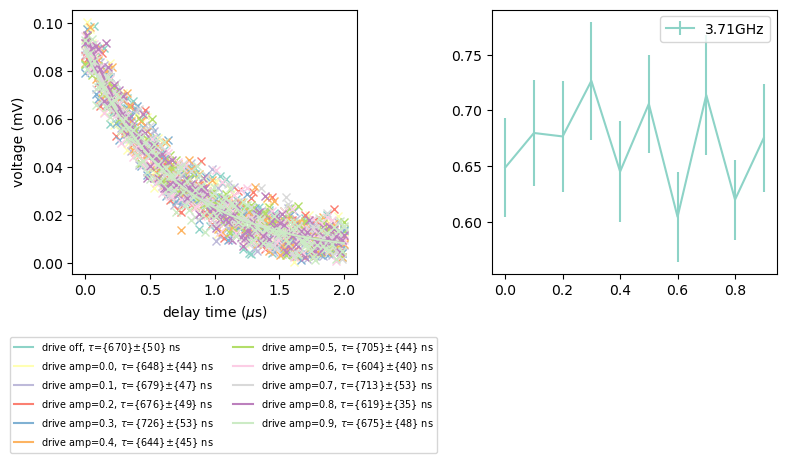

In [281]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

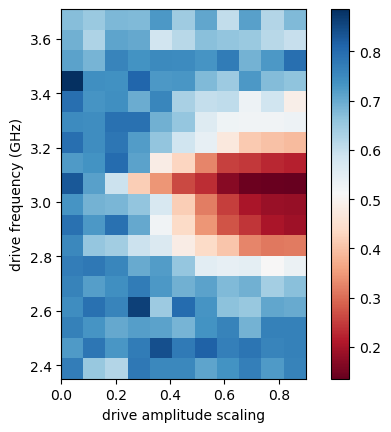

In [282]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.xlabel('drive amplitude scaling')
plt.ylabel('drive frequency (GHz)')
plt.show()

#### retake data on Apr 27

In [299]:
dataDir1 = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230427\\ringdown\\'
dataDir2 = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230426\\ringdown\\'
files1 = list(glob.glob(dataDir1 + 'ringdown_sweepfflPowers_flux=70uA_*.h5'))
files2 = list(glob.glob(dataDir2 + 'ringdown_sweepfflPowers_flux=70uA_*.h5'))
files = files1 + files2


In [302]:
files.sort(key=lambda f: float(f.split('fflFreq=')[1].split('GHz')[0]))

(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=(8,5))


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\4048533340.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


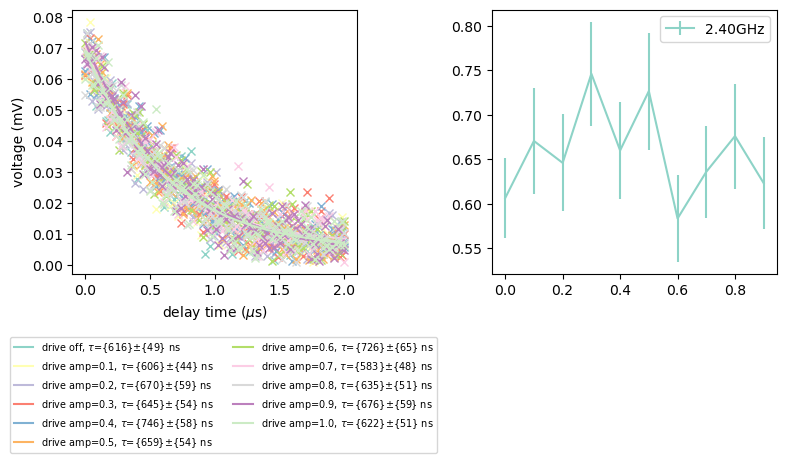

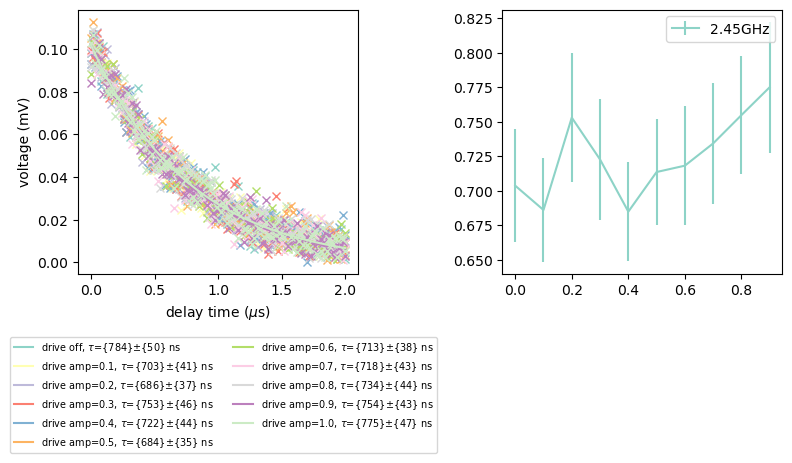

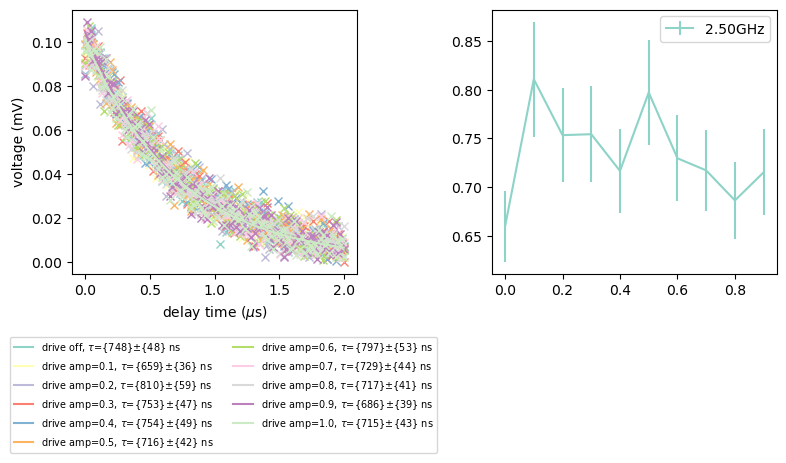

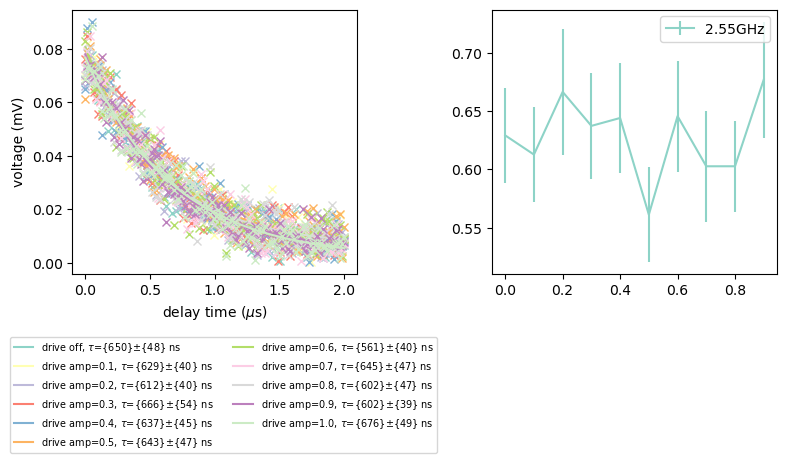

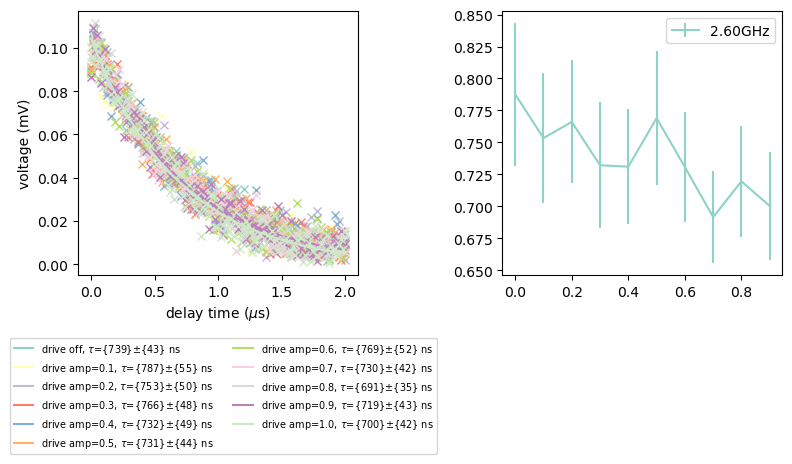

...

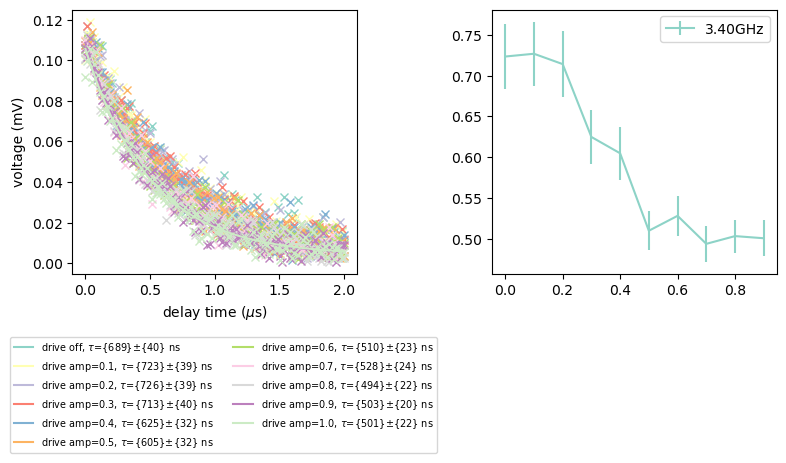

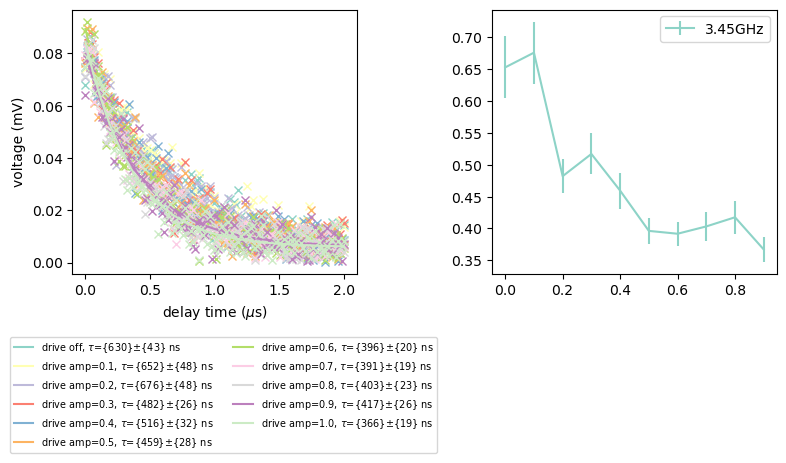

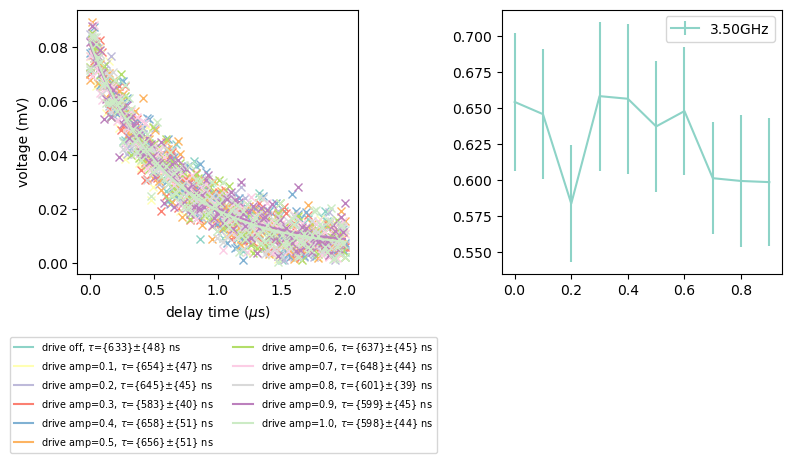

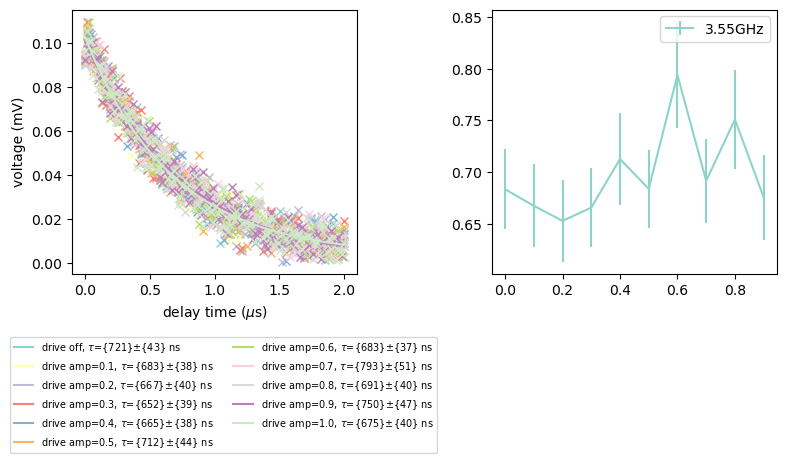

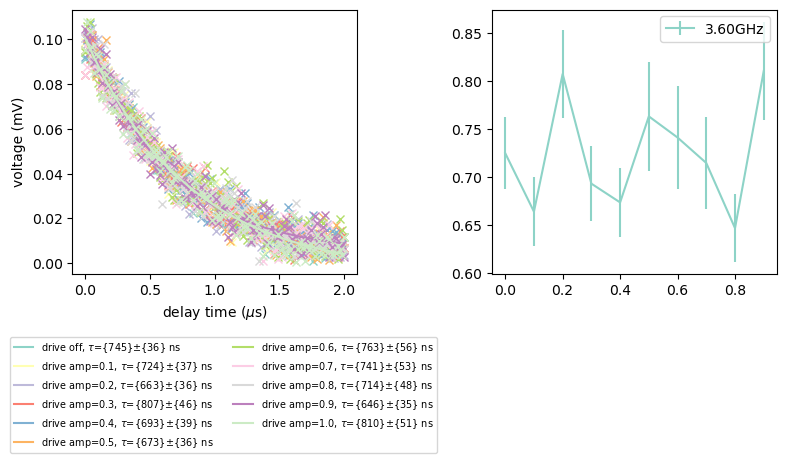

In [313]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

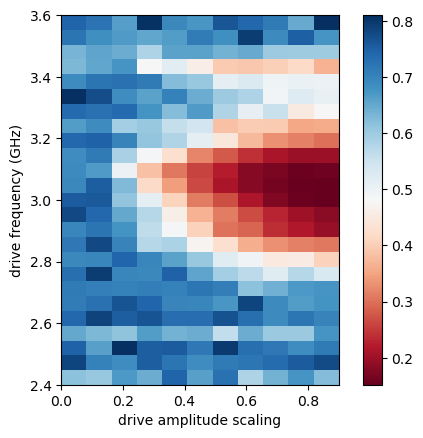

In [314]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.xlabel('drive amplitude scaling')
plt.ylabel('drive frequency (GHz)')
plt.show()

#### take a slice with homodyne

In [315]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230427\\ringdown\\'
file = 'ringdown_sweepfflFreq_flux=70uA_amp_ffl_scale=0.8_DA=18dB_fDA=30dB_rrLen=1000clks_amp_r_scale=1=navg=50000_5.h5'

In [318]:
f =  h5py.File(dataDir + file, 'r')
key = list(f.keys())[0]
freq_keys = list(f[key].keys())
num_of_entries = len(amp_keys)

(25,) (25,) 25


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2609824118.py:45: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


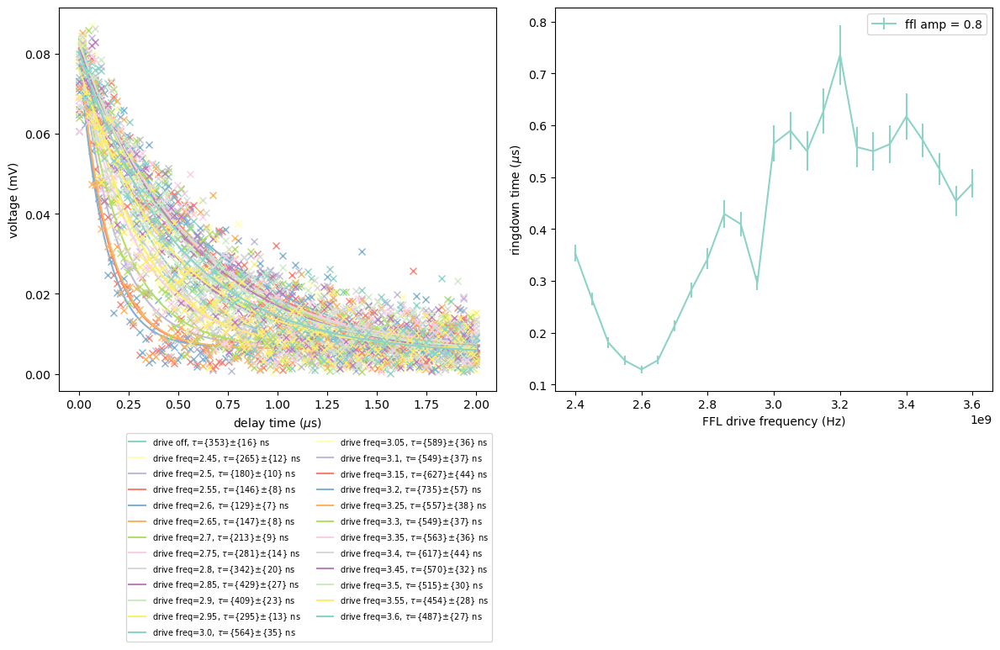

In [341]:
freq_list = [float(f.split(' = ')[1]) for f in freq_keys]
fig, axes = plt.subplots(1, 2, figsize=(12,8))

t1 = np.zeros((num_of_entries,))
t1_err = np.zeros((num_of_entries,))

colors = sns.color_palette("Set3", num_of_entries)

for i in range(num_of_entries):
    entry0 = amp_keys[i]
    time = np.array(f[key][entry0]['t'])
    data = np.array(f[key][entry0]['I']) + 1j * np.array(f[key][entry0]['Q'])
    mag = abs(data) * 1e3
    tau = 0.2
    amp = abs(mag[0] - mag[-1])
    offset = 0

    p0 = [amp,tau,offset]
    fitFunction = decay
    fitted_pars, covar = curve_fit(fitFunction, time, mag,p0=p0,method='trf',xtol=1e-12,maxfev=40e3)
    error = np.sqrt(abs(np.diag(covar)))
    t1[i] = fitted_pars[1]
    t1_err[i] = error[1]

    
    axes[0].plot(time, mag ,'x',color = colors[i])
    if i != 0:
        label='drive freq='+str(round(float(entry0.split(' = ')[1])/1e9,5)) + ', '
    else:
        label = 'drive off, '

    axes[0].plot(time, decay(time,fitted_pars[0], fitted_pars[1], fitted_pars[2]),'-',color =colors[i],label=label+r'$\tau$'+'={%d}'%(fitted_pars[1]*1e3)+r'$\pm$'+'{%d} ns'%(t1_err[i]*1e3))
    axes[0].set_xlabel('delay time ('+r'$\mu$'+'s)')
    axes[0].set_ylabel('voltage (mV)')
    axes[0].legend(fontsize=7,bbox_to_anchor=(1, -0.1),ncol=2)
        
        

print(t1.shape, t1_err.shape, num_of_entries)
axes[-1].errorbar(freq_list, t1, yerr=t1_err,color=colors[0], label=f'ffl amp = 0.8')
axes[-1].set_ylabel('ringdown time ($\mu$s)')
axes[-1].set_xlabel('FFL drive frequency (Hz)')
axes[-1].legend()
fig.tight_layout()
fig.show()

# sweep readout power

## amp_r_scale = 0.5

In [226]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\20230419\\ringdown\\'
files = list(glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=*_DA=18dB_fDA=30dB_rrLen=1000clks_amp_r_scale=0.5=navg=100000*.h5'))


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplot

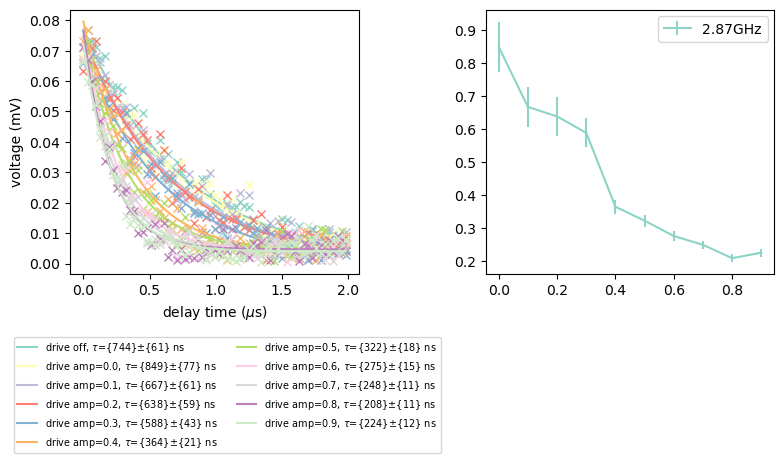

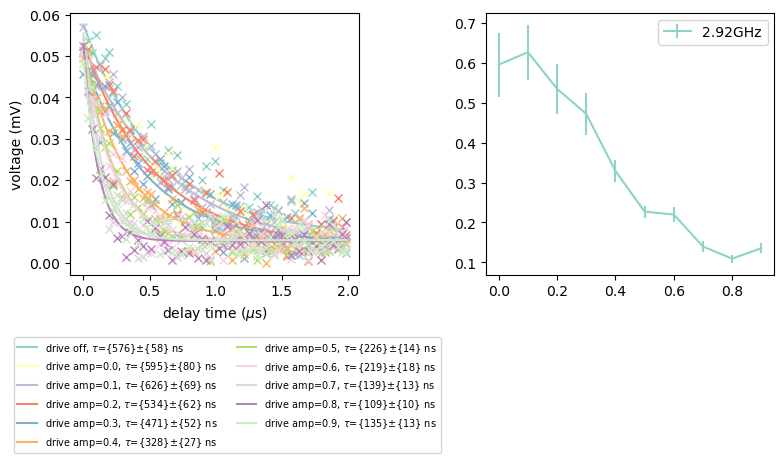

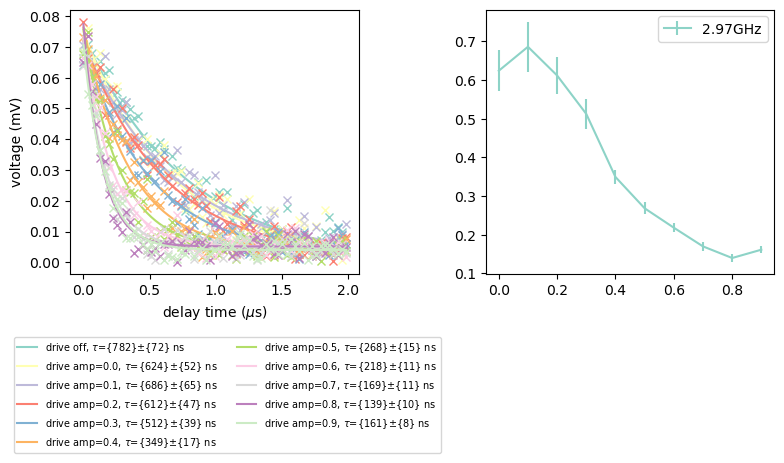

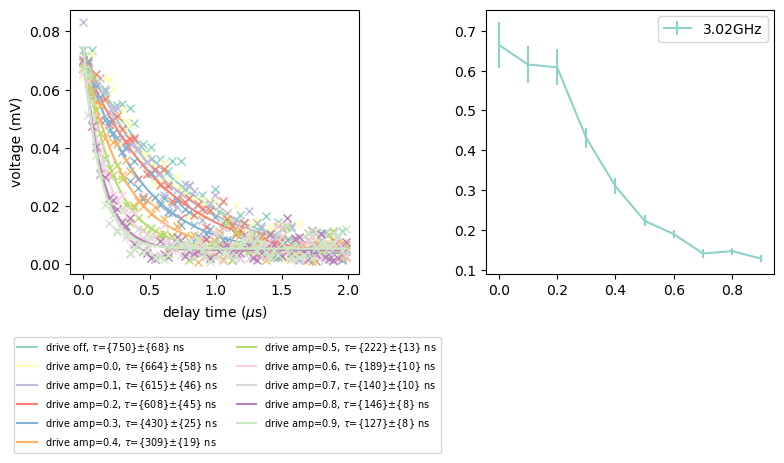

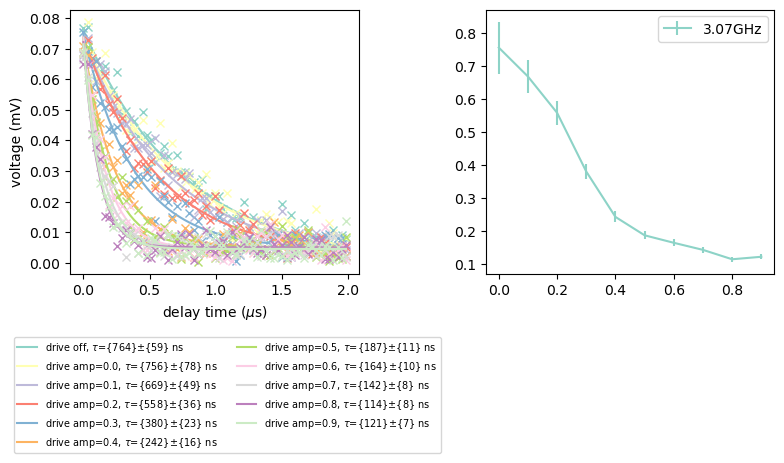

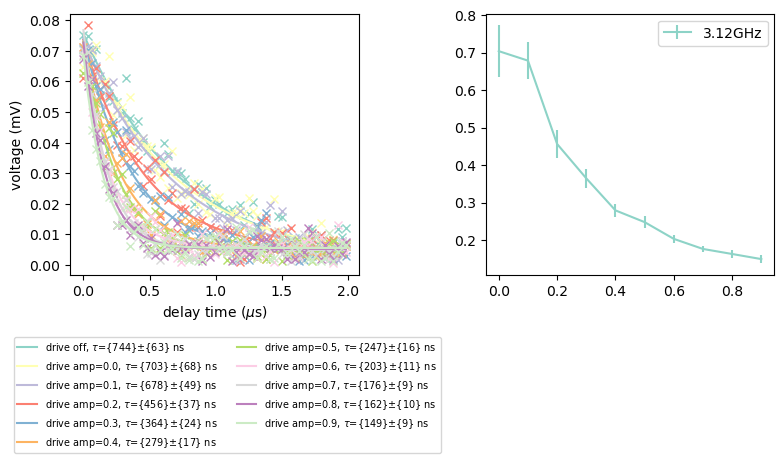

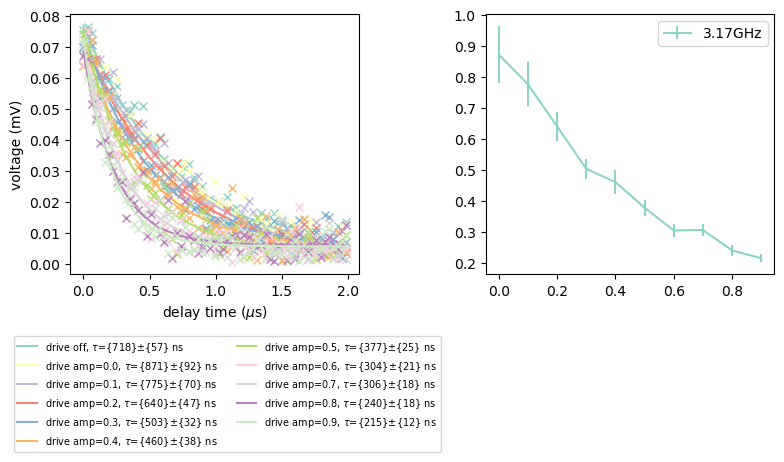

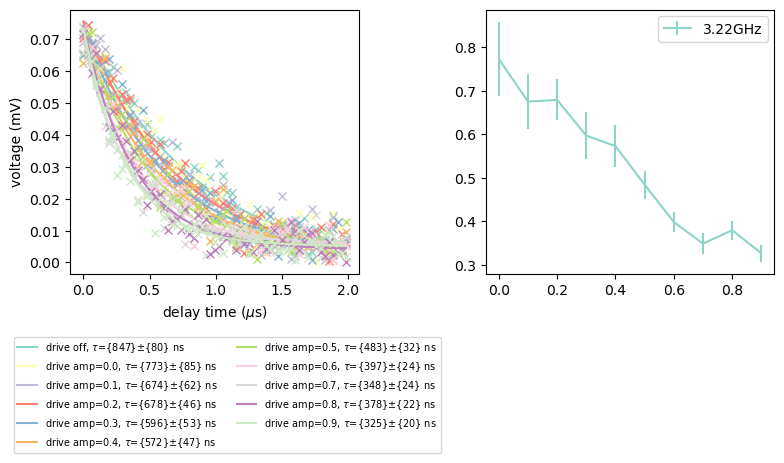

In [238]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

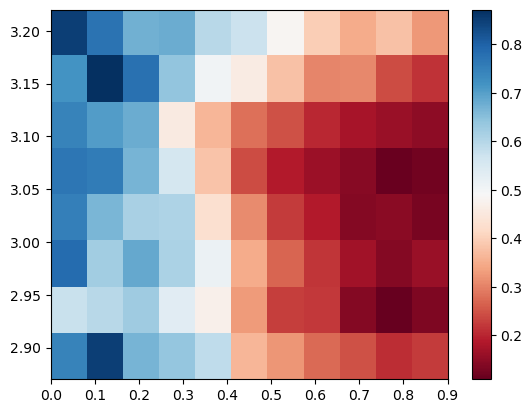

In [240]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower',aspect='auto', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.show()

## amp_r_scale = 0.3

In [243]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\*\\ringdown\\'
files = list(glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=*_DA=18dB_fDA=30dB_rrLen=1000clks_amp_r_scale=0.3=navg=200000*.h5'))


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplot

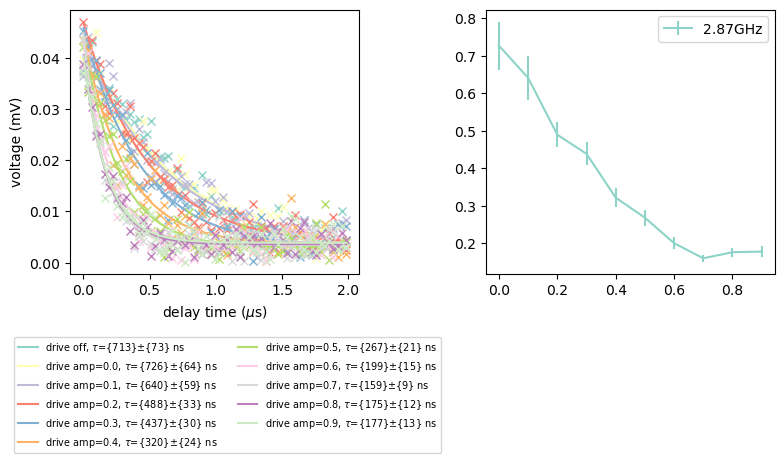

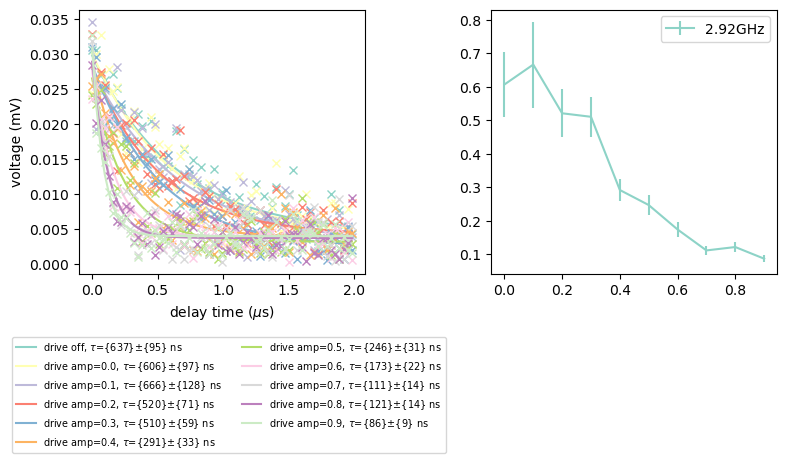

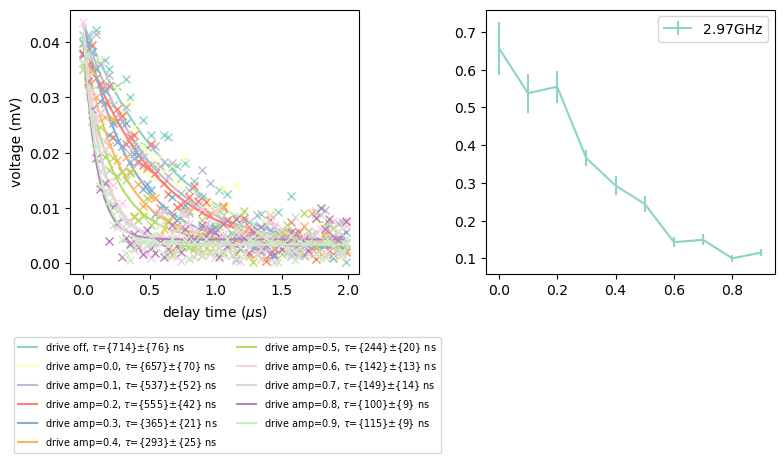

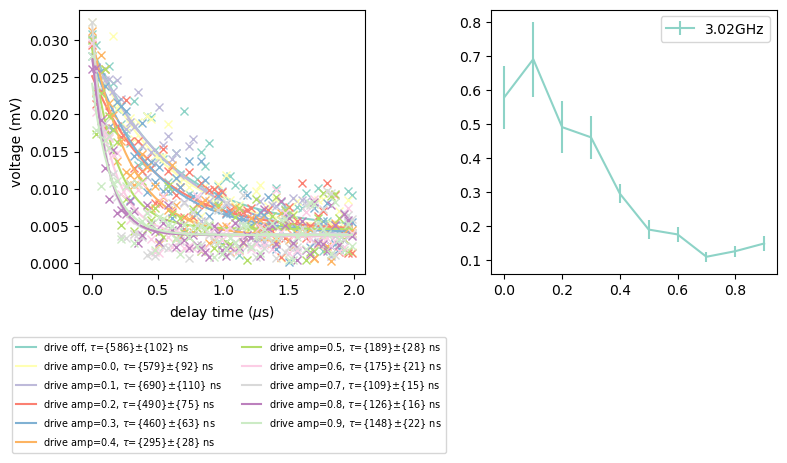

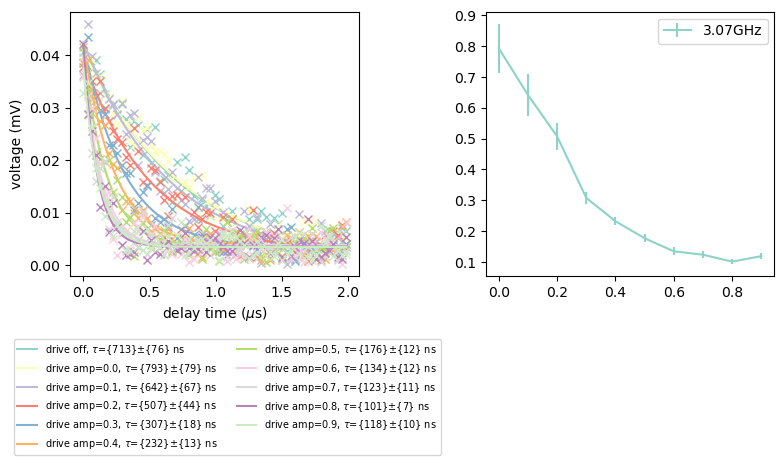

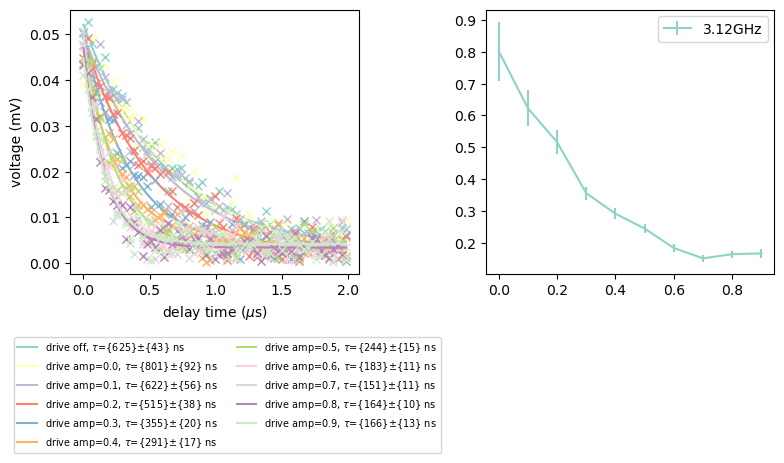

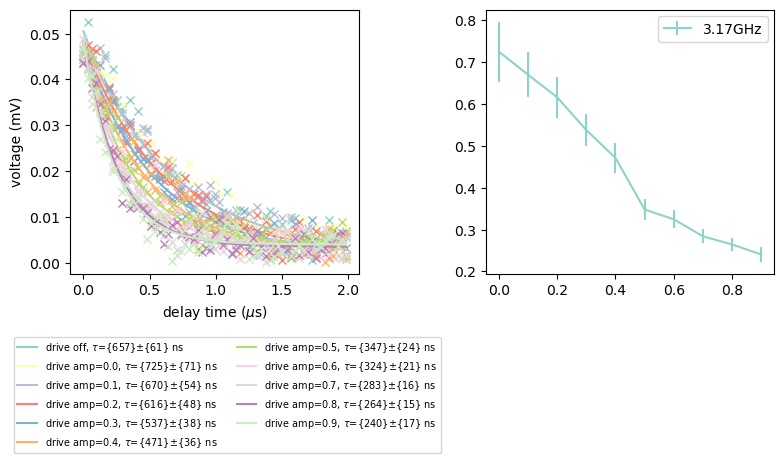

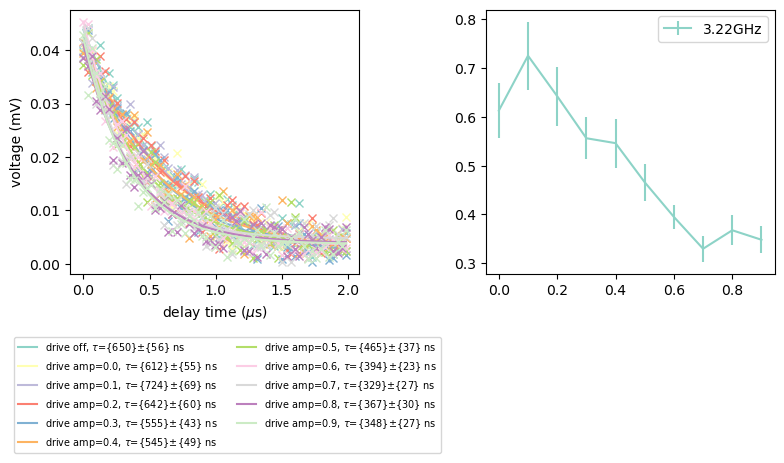

In [245]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

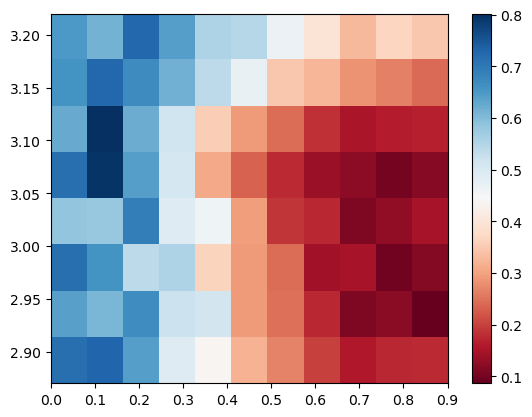

In [246]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower',aspect='auto', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.show()

### short time scale 1 us

In [247]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\*\\ringdown\\'
files = list(glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=*_DA=18dB_fDA=30dB_rrLen=1000clks_amp_r_scale=0.3=navg=400000*.h5'))


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2997934900.py:57: UserWarning: Matplotlib is currently using module://matplot

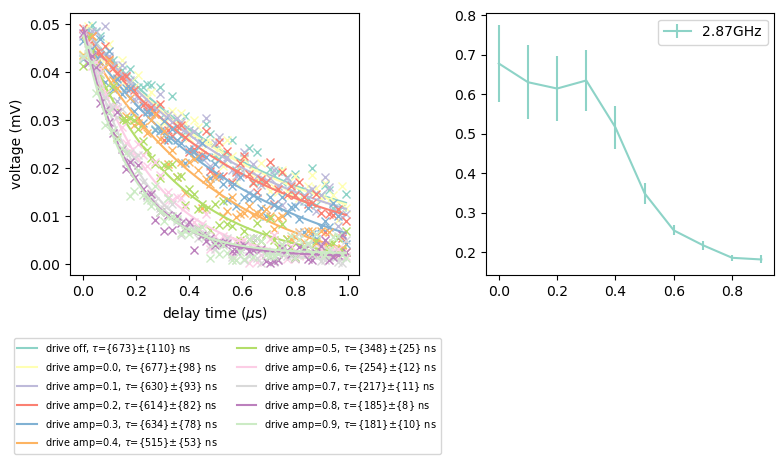

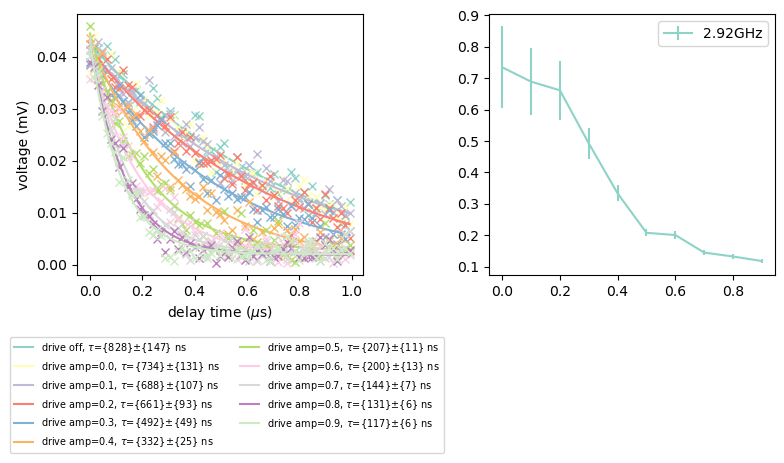

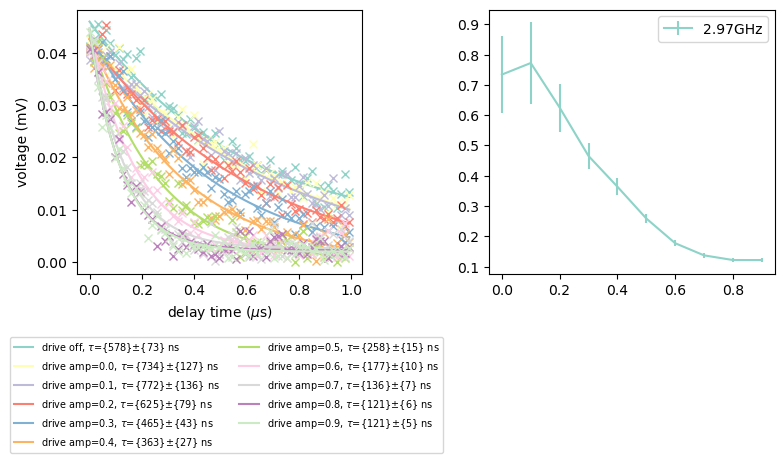

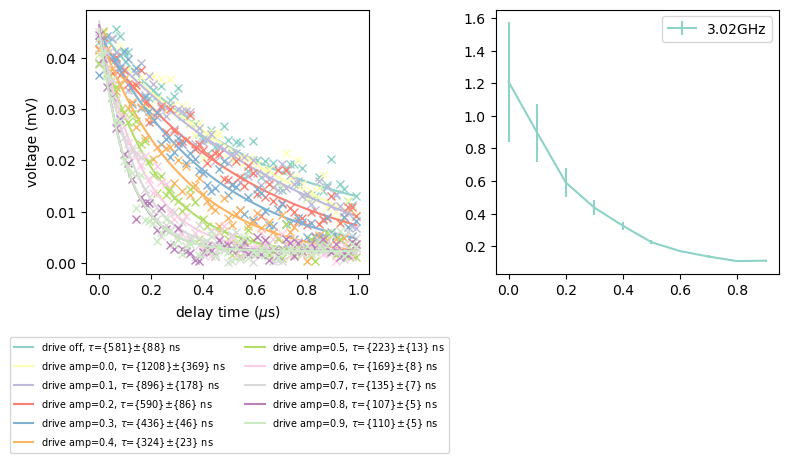

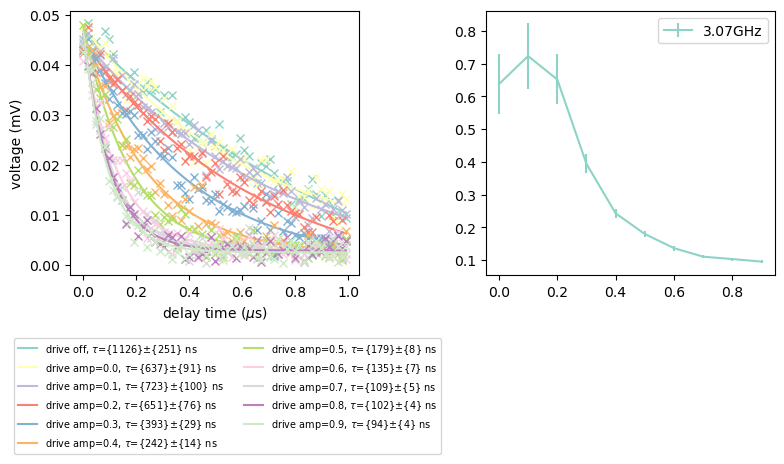

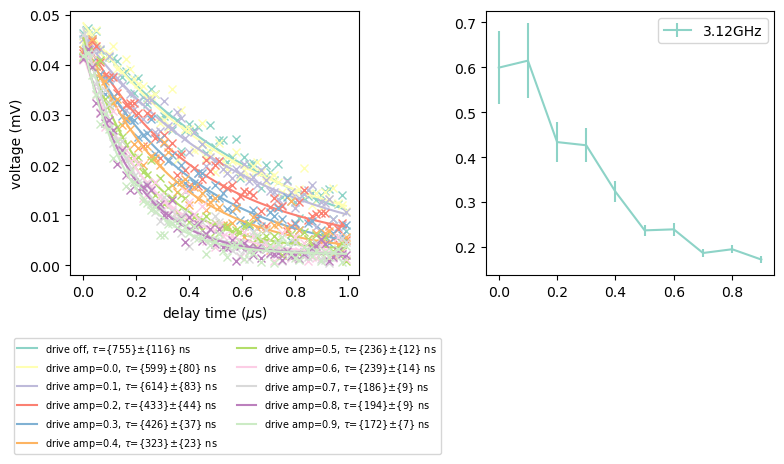

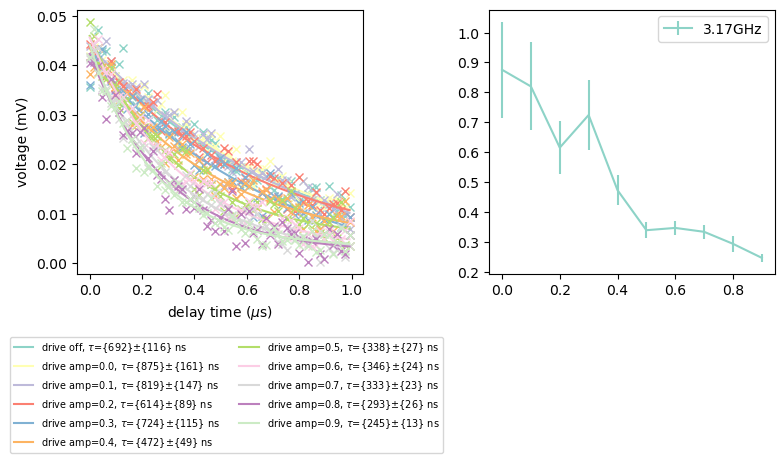

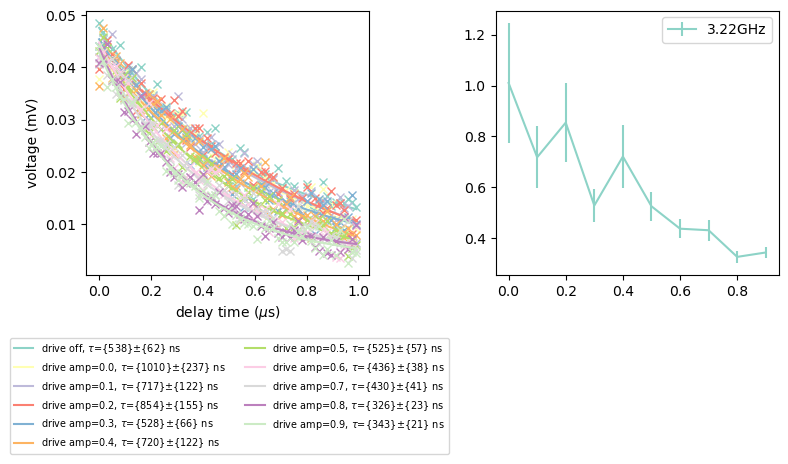

In [249]:
data = np.zeros((len(files), num_of_entries))
data_err = np.zeros((len(files), num_of_entries))
freq_list = np.zeros((len(files,)))
for i,f in enumerate(files):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

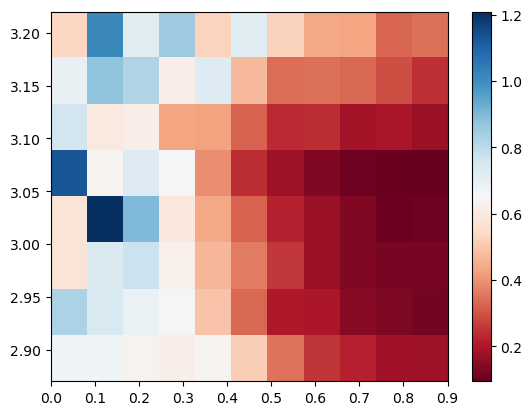

In [250]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower',aspect='auto', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.show()

In [277]:
freq_list

array([2.92, 2.97, 3.02, 3.07])

### short time scale 500 us

In [265]:
dataDir = 'G:\\Shared drives\\CavityCooling\\data\\diss09_5578\\*\\ringdown\\'
files = list(glob.glob(dataDir + 'ringdown_sweepPowers_flux=70uA_fflFreq=*_DA=18dB_fDA=30dB_rrLen=1000clks_amp_r_scale=0.3=navg=800000*.h5'))


In [271]:
fname = files[0]
f =  h5py.File(fname, 'r')
key = list(f.keys())[0]
amp_keys = list(f[key].keys())
key

'sweep_ffl_amp_01:27:39'

In [272]:
f[key]

<HDF5 group "/sweep_ffl_amp_01:27:39" (0 members)>

(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


(11,) (11,) 11


C:\Users\LFL\AppData\Local\Temp\ipykernel_9264\2932613405.py:59: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


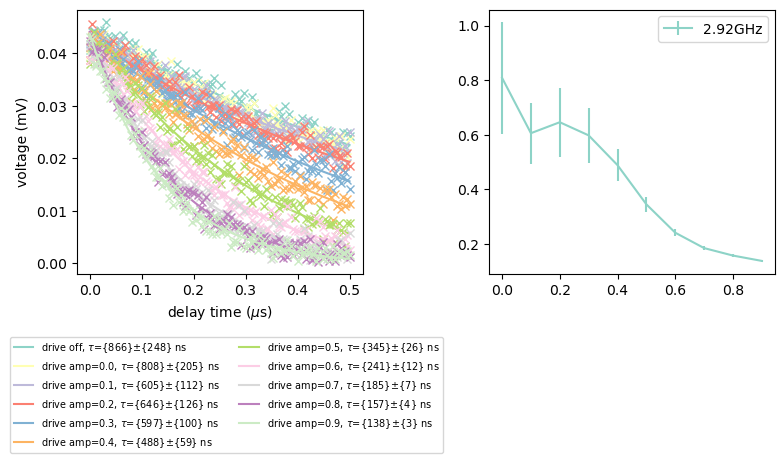

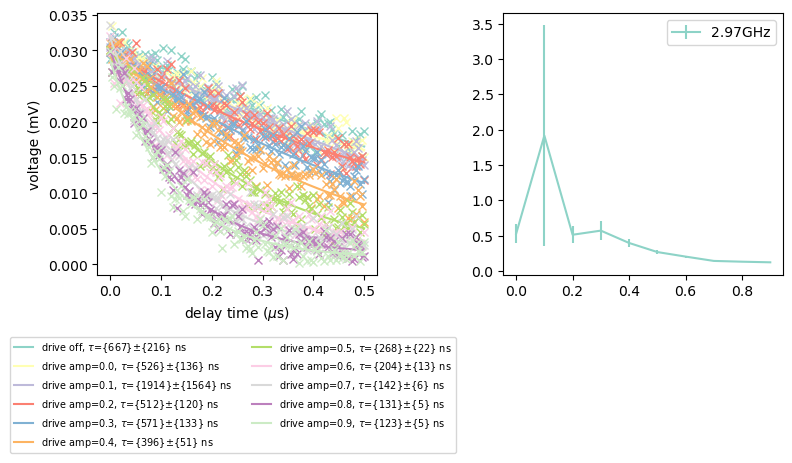

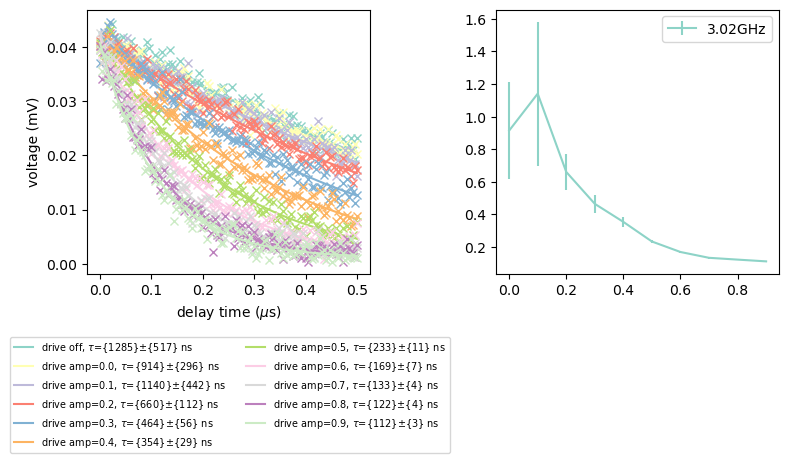

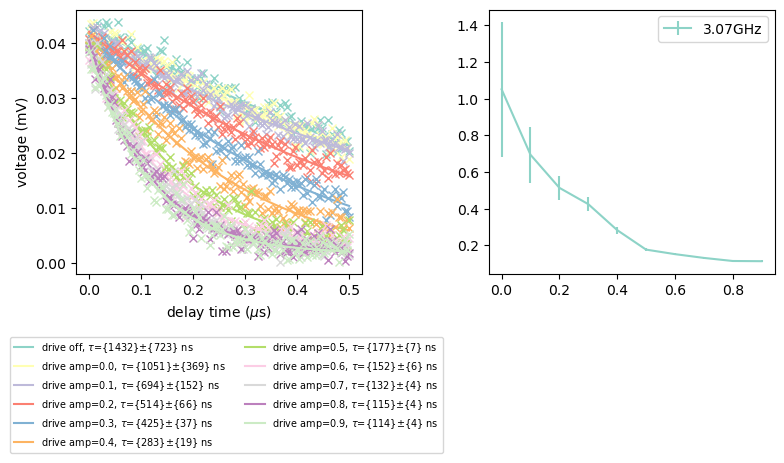

In [275]:
data = np.zeros((len(files)-1, num_of_entries))
data_err = np.zeros((len(files)-1, num_of_entries))
freq_list = np.zeros((len(files,)-1))
for i,f in enumerate(files[1:]):
    freq_list[i] = float(f.split('fflFreq=')[1].split('GHz')[0])
    t1, t1_err = plot_sweep_data(f)
    data[i,:] = t1
    data_err[i,:] = t1_err

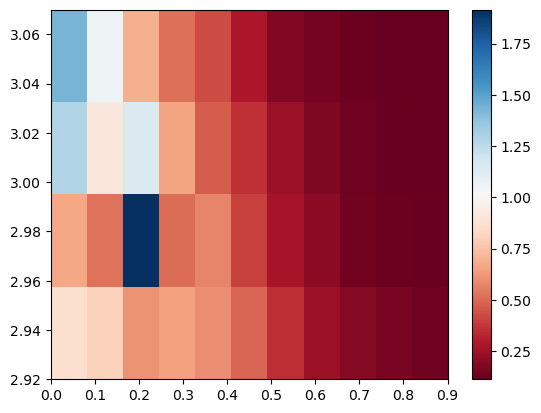

In [276]:
plt.imshow(data, cmap='RdBu', interpolation='nearest',origin='lower',aspect='auto', extent=[amp_list[0],amp_list[-1], freq_list[0], freq_list[-1]])
plt.colorbar()
plt.show()